# **EXECUTIVE SUMMARY**

**Business challenge**

The challenge for the Shinkansen Bullet Train Japanese operating company is to ensure its customers satisfaction by optimizing their experience.

In this regard, the objective of this study is to assist the railway operator in identifying the key indicators contributing to a passenger overall travel experience based on a machine learning model capable of predicting their satisfaction.

It will be used to understand the key parameters playing an important role in  users feedback and improve them for a better customers experience .


**Key takeaways**

In order to achieve the goal of the study, a data mining technique has been employed starting with data pre-processing where null, redundant, missing values and outliers were removed from the dataset made available.

Also, as part of the feature engineering, new variables have been introduced to better characterize passangers by xxxx, xxxx, xxxx and xxxx.

Then, an Exploratory Data Analysis (EDA) has been conducted in order to understand thoroughly the dataset and derive the key business insights and recommendations summarized hereafter:

<ins>Business insights :</ins>


> *   xxx
> *   xxx
> *   xxx> *   xxx
> *   xxx
> *   xxx

<ins>Machine learning model building</ins>

Eventually, within the framework of a supervised machine learning study, xxx regressors have been trained, tested, fine tuned and their performances compared in terms of xxxx metrics.

The study has been conducted with a train-test split of 50%-50% (3544 rows out of 7088) with a random states of 1.

Among all the models, the xxx has shown the optimum metrics with :
*   xxx
*   xxx
*   xxx

In a nutshell, the metrics of the model are the best among all the models and the overall accuracy of the model with a *   xxx.

The final model of xxx is specified with the following parameters :
*   xxx
*   xxx
*   xxx

The model could be further improved by further extensive fine tuning.

As the model is part of the ensemble learning techniques its interpretability is mostly through the features importance. As a matter of fact, most important features of the model are :
*   xxx
*   xxx
*   xxx


**Reserves and limitations of the model**

It is to be noted the following limitations of the model based on the patterns identified within the EDA:

> *   xxx
> *   xxx
> *   xxx

**Key next steps**

The selected model can be used in the near future for making real time predictions and be integrated into Shinkansen bullet train operator application.

In this regard, the following actions can be done :
> *   Create a pipeline that can be used in future applications or as a starting point for further model development.

> *   Saving the trained model in the Pickle format for further use in other applications

> *   Create a HTML page that calculate the used car price based on the most important features

> *   Launch in production on a cloud solution such as AWS

# **1. Table of content**

1. Table of content
1. Used Cars Prediction
1. Mount the google drive
1. Install packages
1. Loading libraries
1. Load the data
1. Data overview
1. Exploratory data analysis
1. Data preprocessing
1. Univariate analysis
1. Bivariate analysis
1. Multivariate analysis
1. Important insights from EDA and data preprocessing
1. Data preparation for building machine learning models
1. Building linear regression models
1. Models assumptions and performances checking
1. Models comparisons
1. Models hyperparameters tuning with GridSearchCV
1. Final model
1. Conclusions and recommendations
1. Next Steps
1. Export to HTML

# **2. Shinkansen bullet train passengers satisfaction prediction**

## **2.1 Problem Definition**

### **The Context:**

The challenge for the Shinkansen Bullet Train Japanese operating company is to ensure its customers satisfaction by optimizing their experience.


### **The objective:**

In this regard, the objective of this study is to assist the railway operator in identifying the key indicators contributing to a passenger overall travel experience based on a machine learning model capable of predicting their satisfaction.

It will be used to understand the key parameters playing an important role in  users feedback and improve them for a better customers experience .


### **The key questions:**

- What are the most important factors/features influencing the pasengers overall experience ?
- How has the passengers satisfaction evolved over the past years ?

### **The problem formulation**:

- Which machine learning classification model best predict the japanese Shinkansen bullet train passengers satisfaction ?

## **2.2 Data Dictionary**
**ID**

**Gender**

**Customer_Type**

**Age**

**Type_Travel**

**Travel_Class**

**Travel_Distance**

**Departure_Delay_in_Mins**

**Arrival_Delay_in_Mins**

**Overall_Experience**


**Seat_Comfort**

**Seat_Class**

**Arrival_Time_Convenient**

**Catering**

**Platform_Location**

**Onboard_Wifi_Service**

**Onboard_Entertainment**

**Online_Support**

**Ease_of_Online_Booking**

**Onboard_Service**

**Legroom**

**Baggage_Handling**

**CheckIn_Service**

**Cleanliness**

**Online_Boarding**


# **3. Mount google drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


# **4. Install packages**

In [ ]:
%%capture
cpt = 1
# install nbconvert to convert notebook ipynb to html
# !pip install nbconvert

#Install GIS tools
!pip install mapview

#Install sklearn statistical tools
!pip install scikit-learn
!pip install scikit-learn-extra

#Install shap for features explanation
!pip install shap

#Install other tools
!pip install statsmodels
!pip install xgboost
!pip install tensorflow
!pip install scikit-optimize
!pip install bayesian-optimization

# **5. Loading libraries**

In [ ]:
%%capture
# Install system tool
import os

#Install data scientific tools
import pandas as pd
import numpy as np

#Install data visualization tools
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.ticker as ticker

# Customize seaborn plot figure with grid lines
sns.set(style="white")
sns.set_style("whitegrid", {'grid.color': 'lightgrey','grid.linestyle': '--'})

# Remove scientific notations and display numbers with 3 decimal points instead
pd.options.display.float_format = '{:,.3f}'.format

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

#Importing time
import time

# Importing geographical libraries
import folium
from folium import plugins

# To remove warning errors
import warnings
warnings.filterwarnings("ignore")

# To build models for prediction
from sklearn.model_selection import train_test_split, cross_val_score, KFold, StratifiedKFold, RepeatedStratifiedKFold
from sklearn import linear_model

#To calculate skewness of datasets
from scipy.stats import skew

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier, Ridge, Lasso
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, GradientBoostingClassifier, AdaBoostClassifier, HistGradientBoostingClassifier, ExtraTreesClassifier, RandomTreesEmbedding, VotingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.svm import SVC
from lightgbm import LGBMClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.experimental import enable_halving_search_cv,enable_halving_search_cv  # noqa
from sklearn.model_selection import HalvingRandomSearchCV,HalvingGridSearchCV
from scipy.stats import randint

# To scale the data
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder

# # To check model performance
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_curve, f1_score, recall_score,precision_score, accuracy_score


# # For tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from bayes_opt import BayesianOptimization

#For RandomizedSearchCV
from scipy.stats import uniform


# label encoder
from sklearn import preprocessing

#Import tensorflow libraries
import math
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.losses import MeanSquaredLogarithmicError, MeanSquaredError
import random
from tensorflow.keras import backend
random.seed(1)
np.random.seed(1)
tf.random.set_seed(1)

#For features explanation
import shap

# **6. Load the data**

In [ ]:
# Read the dataset files
survey_df_train = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/Hackathon/Surveydata_train_.csv")
survey_df_test = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/Hackathon/Surveydata_test_.csv")

travel_df_train = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/Hackathon/Traveldata_train_.csv")
travel_df_test = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/Hackathon/Traveldata_test_.csv")

# Merge the data as per the ID
merged_df_train = pd.merge(right=survey_df_train, how='outer', left=travel_df_train, on= 'ID')
merged_df_test = pd.merge(right=survey_df_test, how='outer',left=travel_df_test, on= 'ID')

# Create a copy of the data and work on the copy
data = merged_df_train.copy()
data_test = merged_df_test.copy()

# **7. Data Overview**

## **7.1 Dataset characteristics (head, tail, sample, info)**

### 7.1.1 Data head

In [ ]:
# Display the first 5 rows
print("Data head :")
data.head()

Data head :


,ID,Gender,Customer_Type,Age,Type_Travel,Travel_Class,Travel_Distance,Departure_Delay_in_Mins,Arrival_Delay_in_Mins,Overall_Experience,Seat_Comfort,Seat_Class,Arrival_Time_Convenient,Catering,Platform_Location,Onboard_Wifi_Service,Onboard_Entertainment,Online_Support,Ease_of_Online_Booking,Onboard_Service,Legroom,Baggage_Handling,CheckIn_Service,Cleanliness,Online_Boarding
0,98800001,Female,Loyal Customer,52.000,NaN,Business,272,0.000,5.000,0,Needs Improvement,Green Car,Excellent,Excellent,Very Convenient,Good,Needs Improvement,Acceptable,Needs Improvement,Needs Improvement,Acceptable,Needs Improvement,Good,Needs Improvement,Poor
1,98800002,Male,Loyal Customer,48.000,Personal Travel,Eco,2200,9.000,0.000,0,Poor,Ordinary,Excellent,Poor,Needs Improvement,Good,Poor,Good,Good,Excellent,Needs Improvement,Poor,Needs Improvement,Good,Good
2,98800003,Female,Loyal Customer,43.000,Business Travel,Business,1061,77.000,119.000,1,Needs Improvement,Green Car,Needs Improvement,Needs Improvement,Needs Improvement,Needs Improvement,Good,Excellent,Excellent,Excellent,Excellent,Excellent,Good,Excellent,Excellent
3,98800004,Female,Loyal Customer,44.000,Business Travel,Business,780,13.000,18.000,0,Acceptable,Ordinary,Needs Improvement,NaN,Needs Improvement,Acceptable,Needs Improvement,Acceptable,Acceptable,Acceptable,Acceptable,Acceptable,Good,Acceptable,Acceptable
4,98800005,Female,Loyal Customer,50.000,Business Travel,Business,1981,0.000,0.000,1,Acceptable,Ordinary,Acceptable,Acceptable,Manageable,Needs Improvement,Good,Excellent,Good,Good,Good,Good,Good,Good,Good


### 7.1.2 Data tail

In [ ]:
# Display the last 5 rows
print("Data tail :")
data.tail()

Data tail :


,ID,Gender,Customer_Type,Age,Type_Travel,Travel_Class,Travel_Distance,Departure_Delay_in_Mins,Arrival_Delay_in_Mins,Overall_Experience,Seat_Comfort,Seat_Class,Arrival_Time_Convenient,Catering,Platform_Location,Onboard_Wifi_Service,Onboard_Entertainment,Online_Support,Ease_of_Online_Booking,Onboard_Service,Legroom,Baggage_Handling,CheckIn_Service,Cleanliness,Online_Boarding
94374,98894375,Male,Loyal Customer,32.000,Business Travel,Business,1357,83.000,125.000,0,Poor,Ordinary,Good,Good,Convenient,Poor,Poor,Poor,Poor,Good,Good,Good,Needs Improvement,Good,Poor
94375,98894376,Male,Loyal Customer,44.000,Business Travel,Business,592,5.000,11.000,1,Good,Ordinary,Good,Good,Convenient,Needs Improvement,Excellent,Excellent,Acceptable,Acceptable,Acceptable,Acceptable,Good,Acceptable,Good
94376,98894377,Male,NaN,63.000,Business Travel,Business,2794,0.000,0.000,1,Needs Improvement,Green Car,Needs Improvement,Needs Improvement,Needs Improvement,Good,Excellent,Good,Good,Good,Good,Good,Acceptable,Good,Acceptable
94377,98894378,Male,Loyal Customer,16.000,Personal Travel,Eco,2744,0.000,0.000,0,Needs Improvement,Ordinary,NaN,Needs Improvement,Convenient,Good,Needs Improvement,Good,Good,Acceptable,Good,Good,Good,Excellent,Good
94378,98894379,Male,Loyal Customer,54.000,NaN,Eco,2107,28.000,28.000,0,Acceptable,Ordinary,Poor,Acceptable,Manageable,Acceptable,Acceptable,Acceptable,Acceptable,Poor,Good,Good,Poor,Good,Acceptable


### 7.1.3 Data sample

In [ ]:
# Display a random sample of 5 rows
print("Data random sample :")
data.sample(n=5, replace=False, random_state=1)

Data random sample :


,ID,Gender,Customer_Type,Age,Type_Travel,Travel_Class,Travel_Distance,Departure_Delay_in_Mins,Arrival_Delay_in_Mins,Overall_Experience,Seat_Comfort,Seat_Class,Arrival_Time_Convenient,Catering,Platform_Location,Onboard_Wifi_Service,Onboard_Entertainment,Online_Support,Ease_of_Online_Booking,Onboard_Service,Legroom,Baggage_Handling,CheckIn_Service,Cleanliness,Online_Boarding
45654,98845655,Female,Loyal Customer,41.000,Business Travel,Business,1167,2.000,0.000,1,Acceptable,Ordinary,Acceptable,Acceptable,Manageable,Acceptable,Excellent,Good,Excellent,Excellent,Excellent,Excellent,Acceptable,Excellent,Good
5978,98805979,Male,Loyal Customer,50.000,Business Travel,Business,1791,0.000,0.000,1,Needs Improvement,Green Car,Needs Improvement,Needs Improvement,Needs Improvement,Needs Improvement,Excellent,Excellent,Good,Good,Good,Good,Excellent,Good,Acceptable
18758,98818759,Male,Loyal Customer,46.000,Business Travel,Business,3747,94.000,94.000,1,Needs Improvement,Ordinary,Needs Improvement,Needs Improvement,Needs Improvement,Excellent,Acceptable,Needs Improvement,Excellent,Excellent,Excellent,Excellent,Needs Improvement,Excellent,Good
88394,98888395,Female,Loyal Customer,45.000,Business Travel,Eco,2288,133.000,120.000,1,Excellent,Ordinary,Excellent,Excellent,Very Convenient,Excellent,Excellent,Excellent,Acceptable,Excellent,Acceptable,Good,Excellent,Poor,Excellent
1833,98801834,Male,Loyal Customer,26.000,Personal Travel,Eco,2928,111.000,158.000,0,Poor,Green Car,Good,Poor,Convenient,Poor,Excellent,Excellent,Excellent,Good,Good,Excellent,Excellent,Good,Excellent


### 7.1.4 Data shape

In [ ]:
# Display dataset shape
print("Training dataset is constituted with :",data.shape[0], "rows and",data.shape[1], "columns")

Training dataset is constituted with : 94379 rows and 25 columns


In [ ]:
# Display dataset shape
print("Dataset is constituted with :",data_test.shape[0], "rows and",data_test.shape[1], "columns")

Dataset is constituted with : 35602 rows and 24 columns


### 7.1.5 Data info

In [ ]:
# Display data info
print("Data info :")
data.info()

Data info :
<class 'pandas.core.frame.DataFrame'>
Int64Index: 94379 entries, 0 to 94378
Data columns (total 25 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       94379 non-null  int64  
 1   Gender                   94302 non-null  object 
 2   Customer_Type            85428 non-null  object 
 3   Age                      94346 non-null  float64
 4   Type_Travel              85153 non-null  object 
 5   Travel_Class             94379 non-null  object 
 6   Travel_Distance          94379 non-null  int64  
 7   Departure_Delay_in_Mins  94322 non-null  float64
 8   Arrival_Delay_in_Mins    94022 non-null  float64
 9   Overall_Experience       94379 non-null  int64  
 10  Seat_Comfort             94318 non-null  object 
 11  Seat_Class               94379 non-null  object 
 12  Arrival_Time_Convenient  85449 non-null  object 
 13  Catering                 85638 non-null  object 
 14  Platform_L

In [ ]:
# Display data info
print("Data test info :")
data_test.info()

Data test info :
<class 'pandas.core.frame.DataFrame'>
Int64Index: 35602 entries, 0 to 35601
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       35602 non-null  int64  
 1   Gender                   35572 non-null  object 
 2   Customer_Type            32219 non-null  object 
 3   Age                      35591 non-null  float64
 4   Type_Travel              32154 non-null  object 
 5   Travel_Class             35602 non-null  object 
 6   Travel_Distance          35602 non-null  int64  
 7   Departure_Delay_in_Mins  35573 non-null  float64
 8   Arrival_Delay_in_Mins    35479 non-null  float64
 9   Seat_Comfort             35580 non-null  object 
 10  Seat_Class               35602 non-null  object 
 11  Arrival_Time_Convenient  32277 non-null  object 
 12  Catering                 32245 non-null  object 
 13  Platform_Location        35590 non-null  object 
 14  Onboa

## **7.2 Observations on dataset characteristics**

*   The dataset is constituted with 94379 observations and 25 columns.

*   The features are of numerical and categorical types such as :
  -   19 features are of object type
  -   3 features are of integer type
  -  3 features are of float type
  
*   Some features are having missing values

# **8. Exploratory Data Analysis**

## **8.1 Numerical data statistics summary**

In [ ]:
#Let's check skewness of features
numeric_variables_list = ['Age', 'Travel_Distance', 'Departure_Delay_in_Mins','Arrival_Delay_in_Mins']
all_skewnesses = []
for idx, var in enumerate(numeric_variables_list):
  added_skew=dict()
  added_skew['Feature'] = var
  added_skew['Skewness'] = skew(data[var],axis=0, nan_policy='omit')
  all_skewnesses.append(added_skew)
df_skewness = pd.DataFrame(all_skewnesses, columns=['Feature','Skewness'])
numeric_variables_list = ['Travel_Distance', 'Departure_Delay_in_Mins','Arrival_Delay_in_Mins']
df_skewness

,Feature,Skewness
0,Age,-0.002
1,Travel_Distance,0.473
2,Departure_Delay_in_Mins,7.157
3,Arrival_Delay_in_Mins,6.980


In [ ]:
# Let's check numerical data statistics
data[numeric_variables_list].describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
Travel_Distance,"94,379.000","1,978.888","1,027.961",50.000,"1,359.000","1,923.000","2,538.000","6,951.000"
Departure_Delay_in_Mins,"94,322.000",14.647,38.139,0.000,0.000,0.000,12.000,"1,592.000"
Arrival_Delay_in_Mins,"94,022.000",15.005,38.439,0.000,0.000,0.000,13.000,"1,584.000"


###**Observations on numerical data statistics**

>* **Age** is normally distributed and ranges between 7 to 85 with an average around 39 years. This is in line with Japan ages pyramid


>* **Travel_Distance** is moderately right skewed with a median around 1920 km. The maximum distance of 6951 seems to be an outlier that needs to be addressed during the data pre-processing. This indicates that the travelers are covering long distances.


>* **Departure_Delay_in_Mins** is highly right skewed with some outliers.A log scale would be appropriate for this feature assessment.


>* **Arrival_Delay_in_Mins** is highly right skewed with some outliers.A log scale would be also appropriate for this feature assessment.

## **8.2 Categorical data statistics summary**

In [ ]:
for feat in data.columns:
    if data[feat].dtype == 'object':
        data[feat] = pd.Categorical(data[feat])

for feat in data_test.columns:
    if data_test[feat].dtype == 'object':
        data_test[feat] = pd.Categorical(data_test[feat])

In [ ]:
data = (
    data
    .replace(['Excellent', 'Good', 'Acceptable', 'Needs Improvement', 'Poor', 'Extremely Poor'],[5, 4, 3, 2, 1, 0])
    .replace(['Very Convenient', 'Convenient', 'Manageable', 'Needs Improvement', 'Inconvenient', 'Very Inconvenient'], [5, 4, 3, 2, 1, 0])
    .replace(['Ordinary', 'Green Car'], [0, 1])
    .replace(['Male', 'Female'], [0, 1])
    .replace(['Disloyal Customer', 'Loyal Customer'], [0, 1])
    .replace(['Personal Travel', 'Business Travel'], [0, 1])
    .replace(['Eco', 'Business'], [0, 1])
)

data_test = (
    data_test
    .replace(['Excellent', 'Good', 'Acceptable', 'Needs Improvement', 'Poor', 'Extremely Poor'], [5, 4, 3, 2, 1, 0])
    .replace(['Very Convenient', 'Convenient', 'Manageable', 'Needs Improvement', 'Inconvenient', 'Very Inconvenient'], [5, 4, 3, 2, 1, 0])
    .replace(['Ordinary', 'Green Car'], [0, 1])
    .replace(['Male', 'Female'], [0, 1])
    .replace(['Disloyal Customer', 'Loyal Customer'], [0, 1])
    .replace(['Personal Travel', 'Business Travel'], [0, 1])
    .replace(['Eco', 'Business'], [0, 1])
)

In [ ]:
# View unique values proportion taken by categorical variables
categorical_variables_list = ['Gender',
                              'Customer_Type',
                              'Type_Travel',
                              'Travel_Class',
                              'Overall_Experience',
                              'Seat_Comfort',
                              'Seat_Class',
                              'Arrival_Time_Convenient',
                              'Catering',
                              'Platform_Location',
                              'Onboard_Wifi_Service',
                              'Onboard_Entertainment',
                              'Online_Support',
                              'Ease_of_Online_Booking',
                              'Onboard_Service',
                              'Legroom',
                              'Baggage_Handling',
                              'CheckIn_Service',
                              'Cleanliness',
                              'Online_Boarding']

for cat in categorical_variables_list:
  print('Categorical variable analysis:',cat)
  print(data[cat].value_counts(normalize=False))
  print('==='*20)

Categorical variable analysis: Gender
1    47815
0    46487
Name: Gender, dtype: int64
Categorical variable analysis: Customer_Type
1    69823
0    15605
Name: Customer_Type, dtype: int64
Categorical variable analysis: Type_Travel
1    58617
0    26536
Name: Type_Travel, dtype: int64
Categorical variable analysis: Travel_Class
0    49342
1    45037
Name: Travel_Class, dtype: int64
Categorical variable analysis: Overall_Experience
1    51593
0    42786
Name: Overall_Experience, dtype: int64
Categorical variable analysis: Seat_Comfort
3    21158
2    20946
4    20595
1    15185
5    12971
0     3463
Name: Seat_Comfort, dtype: int64
Categorical variable analysis: Seat_Class
1    47435
0    46944
Name: Seat_Class, dtype: int64
Categorical variable analysis: Arrival_Time_Convenient
4    19574
5    17684
3    15177
2    14990
1    13692
0     4332
Name: Arrival_Time_Convenient, dtype: int64
Categorical variable analysis: Catering
3    18468
2    17978
4    17969
1    13858
5    13455
0     3

## **8.3 Map of Japan**

In [ ]:
# Let's have a glance at Japan on a Map
folium.Map(location=[35.652832,139.839478], width ='50%',height='90%', zoom_start =5, crs='EPSG3857', tiles='OpenStreetMap', attr='https://www.openstreetmap.org/relation/2315704')

###**Observations on travelers origin map**
Japan total length from south to north is around 3 800 km.
At a speed of around 300 km/h, it would take Shinkansen bullet train 12 hours and 40 mn to cross the whole country.

We can deduct that it takes 6 hours ad 20 mn to cross half of the country, i.e 1 900 km.

#**9. HistGradientBoosting Classifier - HGB001 test on un-processed data**


In [ ]:
cpt=cpt+1
### Removal of unrelevant variables from data set
# # Removing unrelevant independent variables
# try:
data.drop('ID',axis=1, inplace=True)
data.drop('Arrival_Delay_in_Mins',axis=1, inplace=True)
data.drop('Departure_Delay_in_Mins',axis=1, inplace=True)
# data.drop('Age',axis=1, inplace=True)

# Removing unrelevant independent variables
data_test.drop('ID',axis=1, inplace=True)
data_test.drop('Arrival_Delay_in_Mins',axis=1, inplace=True)
data_test.drop('Departure_Delay_in_Mins',axis=1, inplace=True)

### Creating dummy variables for the categorical variables
# Creating the list of columns for which we need to create the dummy variables
to_get_dummies_for_train = [
                              'Gender',
                              'Customer_Type',
                              'Type_Travel',
                              'Travel_Class',
                              'Seat_Comfort',
                              'Seat_Class',
                              'Arrival_Time_Convenient',
                              'Catering',
                              'Platform_Location',
                              'Onboard_Wifi_Service',
                              'Onboard_Entertainment',
                              'Online_Support',
                              'Ease_of_Online_Booking',
                              'Onboard_Service',
                              'Legroom',
                              'Baggage_Handling',
                              'CheckIn_Service',
                              'Cleanliness',
                              'Online_Boarding'
                              ]
# Creating dummy variables for the categorical variables
data = pd.get_dummies(data, columns = to_get_dummies_for_train,drop_first = True)

# Creating the list of columns for which we need to create the dummy variables
to_get_dummies_for_test_hcktn = [
                              'Gender',
                              'Customer_Type',
                              'Type_Travel',
                              'Travel_Class',
                              'Seat_Comfort',
                              'Seat_Class',
                              'Arrival_Time_Convenient',
                              'Catering',
                              'Platform_Location',
                              'Onboard_Wifi_Service',
                              'Onboard_Entertainment',
                              'Online_Support',
                              'Ease_of_Online_Booking',
                              'Onboard_Service',
                              'Legroom',
                              'Baggage_Handling',
                              'CheckIn_Service',
                              'Cleanliness',
                              'Online_Boarding'
                              ]
# Creating dummy variables for the categorical variables
data_test = pd.get_dummies(data_test, columns = to_get_dummies_for_test_hcktn,drop_first = True)

# except:
#     pass


### Separate independent variables (Predictors) from target variable

x = data.drop('Overall_Experience',axis=1)
y = data['Overall_Experience']
x_data_test = data_test

### Extract the target (dependent/outcome) variable
# We are extracting the outcome variable separately


In [ ]:
### Splitting the dataset into train and test datasets
x_train_local, x_test_local, y_train_local, y_test_local = train_test_split(x, y, train_size = 0.8, test_size = 0.2, shuffle = True, random_state = 1)

# Checking the shape of the train and test data
print("Shape of Training set predictors : ", x_train_local.shape)
print("Shape of test set predictors: ", x_test_local.shape)

print("Shape of Training set target: ", y_train_local.shape)
print("Shape of test set target: ", y_test_local.shape)


### Scaling the numerical variables
# Creating an instance of the MinMaxScaler
scaler = MinMaxScaler() #StandardScaler()

# Applying fit_transform on the training features data
x_train_scaled_local = scaler.fit_transform(x_train_local)
x_test_scaled_local = scaler.fit_transform(x_test_local)

# Applying fit_transform on the hackathon features data
print("Shape of testing set predictors : ", x_data_test.shape)
x_test_scaled_hcktn = scaler.fit_transform(x_data_test)


# The above scaler returns the data in array format, below we are converting it back to pandas DataFrame
x_train_scaled_local = pd.DataFrame(x_train_scaled_local, index = x_train_local.index, columns = x_train_local.columns)
x_test_scaled_local = pd.DataFrame(x_test_scaled_local, index = x_test_local.index, columns = x_test_local.columns)

# The above scaler returns the data in array format, below we are converting it back to pandas DataFrame
x_test_scaled_hcktn = pd.DataFrame(x_test_scaled_hcktn, index = x_data_test.index, columns = x_data_test.columns)


### Building classifier models

# Observed data
x_train_st_local = x_train_scaled_local
x_test_st_local = x_test_scaled_local
y_observed_train_local = y_train_local
y_observed_test_local = y_test_local

# Instantiate the models
models = []
models.append(('HistGradientBoostingClassifier',HistGradientBoostingClassifier(random_state=None, learning_rate = 0.1, max_depth=5, max_iter=500)))

perfs=[]
for idx, model_i in enumerate(models): #accuracy on train set from training data
    added_perf = dict()
    mod_i = model_i[1]

    mod_i.fit(x_train_st_local , y_observed_train_local)

    folds = RepeatedStratifiedKFold(n_splits=10, n_repeats=1, random_state=1)

    train_accuracy = cross_val_score(mod_i, x_train_st_local, y_observed_train_local, scoring="accuracy", cv=folds, n_jobs=-1, error_score='raise').mean()
    print('train_accuracy:',train_accuracy)

    test_accuracy = cross_val_score(mod_i, x_test_st_local, y_observed_test_local, scoring="accuracy", cv=folds, n_jobs=-1, error_score='raise').mean()
    print('test_accuracy:',test_accuracy)

    added_perf['Model accuracy'] = model_i[0]
    added_perf['Train'] = train_accuracy
    added_perf['Test'] = test_accuracy

    perfs.append(added_perf)

    pd.options.display.float_format = '{:,.5f}'.format
    perfs_df = pd.DataFrame(perfs, columns=['Model accuracy','Train','Test'])
    print(perfs_df)

    #find the columns that are different in data.columns and data_test.columns
    dif_dta = pd.DataFrame(set(x.columns).symmetric_difference(set(x_data_test.columns)))
    data_size=data.columns.shape[0]
    data_test_size=data_test.columns.shape[0]

    for idx, i in dif_dta.iterrows():
        x_test_scaled_hcktn[dif_dta.loc[idx]] = 0


    x_test_scaled_hcktn = x_test_scaled_hcktn[x_train_st_local.columns]

    y_pred_train_hcktn = mod_i.predict(x_test_scaled_hcktn)

    result_final = pd.DataFrame(data={'ID': range(99900001,99935603), 'Overall_Experience': y_pred_train_hcktn}).set_index('ID').sort_index(ascending=True)
    result_final.to_csv("/content/drive/MyDrive/Colab_Notebooks/Hackathon/Shinkansen_sentinels_HGB0_"+str(2*cpt+2)+".csv", index = True)
    print('Reference file N°=',2*cpt+2)

Shape of Training set predictors :  (75503, 76)
Shape of test set predictors:  (18876, 76)
Shape of Training set target:  (75503,)
Shape of test set target:  (18876,)
Shape of testing set predictors :  (35602, 71)
train_accuracy: 0.9509424496207248
test_accuracy: 0.9422550759882515
                   Model accuracy   Train    Test
0  HistGradientBoostingClassifier 0.95094 0.94226
Reference file N°= 6


# **10. Data Preprocessing**

##**10.1 Data reinitialization**

In [ ]:
# Read the dataset files
survey_df_train = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/Hackathon/Surveydata_train_.csv")
survey_df_test = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/Hackathon/Surveydata_test_.csv")

travel_df_train = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/Hackathon/Traveldata_train_.csv")
travel_df_test = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/Hackathon/Traveldata_test_.csv")

# Merge the data as per the ID
merged_df_train = pd.merge(right=survey_df_train, how='outer', left=travel_df_train, on= 'ID')
merged_df_test = pd.merge(right=survey_df_test, how='outer',left=travel_df_test, on= 'ID')

# Create a copy of the data and work on the copy
data = merged_df_train.copy()
data_test = merged_df_test.copy()

# Encoding values for ordinal categorical features
data = (
    data
    .replace(['Excellent', 'Good', 'Acceptable', 'Needs Improvement', 'Poor', 'Extremely Poor'], [5, 4, 3, 2, 1, 0])
    .replace(['Very Convenient', 'Convenient', 'Manageable', 'Needs Improvement', 'Inconvenient', 'Very Inconvenient'], [5, 4, 3, 2, 1, 0])
    .replace(['Ordinary', 'Green Car'], [0, 1])
    .replace(['Male', 'Female'], [0, 1])
    .replace(['Disloyal Customer', 'Loyal Customer'], [0, 1])
    .replace(['Personal Travel', 'Business Travel'], [0, 1])
    .replace(['Eco', 'Business'], [0, 1])
)

data_test = (
    data_test
    .replace(['Excellent', 'Good', 'Acceptable', 'Needs Improvement', 'Poor', 'Extremely Poor'], [5, 4, 3, 2, 1, 0])
    .replace(['Very Convenient', 'Convenient', 'Manageable', 'Needs Improvement', 'Inconvenient', 'Very Inconvenient'], [5, 4, 3, 2, 1, 0])
    .replace(['Ordinary', 'Green Car'], [0, 1])
    .replace(['Male', 'Female'], [0, 1])
    .replace(['Disloyal Customer', 'Loyal Customer'], [0, 1])
    .replace(['Personal Travel', 'Business Travel'], [0, 1])
    .replace(['Eco', 'Business'], [0, 1])
)

# Online experience
data['All_Online'] = data['Online_Support'] +data['Ease_of_Online_Booking']+data['Online_Boarding']
# Departure experience
data['Depart_exp'] =  data['Platform_Location']+data['Baggage_Handling']+data['CheckIn_Service']+data['Cleanliness']
# Onboard experience
data['Onboard_Exp'] = data['Seat_Comfort']+data['Seat_Class']+data['Catering']+data['Onboard_Wifi_Service']+data['Onboard_Entertainment']+data['Onboard_Service']+data['Legroom']
# Arrival experience
data['Arrival_Exp'] = data['Arrival_Time_Convenient']


# Online experience
data_test['All_Online'] = data_test['Online_Support'] +data_test['Ease_of_Online_Booking']+data_test['Online_Boarding']
# Departure experience
data_test['Depart_exp'] =  data_test['Platform_Location']+data_test['Baggage_Handling']+data_test['CheckIn_Service']+data_test['Cleanliness']
# Onboard experience
data_test['Onboard_Exp'] = data_test['Seat_Comfort']+data_test['Seat_Class']+data_test['Catering']+data_test['Onboard_Wifi_Service']+data_test['Onboard_Entertainment']+data_test['Onboard_Service']+data_test['Legroom']
# Arrival experience
data_test['Arrival_Exp'] = data_test['Arrival_Time_Convenient']

##**10.2 Data cleaning**

In [ ]:
### Removal of unrelevant features

### Replacing typo mistakes

# Check for duplicates
nb_duplicated = data.duplicated().sum()
print('Number of duplicated values =',nb_duplicated)
print('\n')

#Let's drop the duplicated values
rows_to_drop = data[data.duplicated()].index
data.drop(rows_to_drop,axis=0, inplace=True)

# Let's confirm there are no more duplicated values in the data set
print("Duplicated values :")
data[data.duplicated()]

Number of duplicated values = 0


Duplicated values :


,ID,Gender,Customer_Type,Age,Type_Travel,Travel_Class,Travel_Distance,Departure_Delay_in_Mins,Arrival_Delay_in_Mins,Overall_Experience,Seat_Comfort,Seat_Class,Arrival_Time_Convenient,Catering,Platform_Location,Onboard_Wifi_Service,Onboard_Entertainment,Online_Support,Ease_of_Online_Booking,Onboard_Service,Legroom,Baggage_Handling,CheckIn_Service,Cleanliness,Online_Boarding,All_Online,Depart_exp,Onboard_Exp,Arrival_Exp


## **10.3 Identification and treatment of features outliers**

## **10.4 Identification and treatment of missing values**

In [ ]:
# Checking for missing values in the data in percentage
data.isnull().sum()

ID                             0
Gender                        77
Customer_Type               8951
Age                           33
Type_Travel                 9226
Travel_Class                   0
Travel_Distance                0
Departure_Delay_in_Mins       57
Arrival_Delay_in_Mins        357
Overall_Experience             0
Seat_Comfort                  61
Seat_Class                     0
Arrival_Time_Convenient     8930
Catering                    8741
Platform_Location             30
Onboard_Wifi_Service          30
Onboard_Entertainment         18
Online_Support                91
Ease_of_Online_Booking        73
Onboard_Service             7601
Legroom                       90
Baggage_Handling             142
CheckIn_Service               77
Cleanliness                    6
Online_Boarding                6
All_Online                    97
Depart_exp                   175
Onboard_Exp                16389
Arrival_Exp                 8930
dtype: int64

In [ ]:
# Checking for missing values in the data in percentage
data_test.isnull().sum()

ID                            0
Gender                       30
Customer_Type              3383
Age                          11
Type_Travel                3448
Travel_Class                  0
Travel_Distance               0
Departure_Delay_in_Mins      29
Arrival_Delay_in_Mins       123
Seat_Comfort                 22
Seat_Class                    0
Arrival_Time_Convenient    3325
Catering                   3357
Platform_Location            12
Onboard_Wifi_Service         12
Onboard_Entertainment         8
Online_Support               26
Ease_of_Online_Booking       18
Onboard_Service            2872
Legroom                      25
Baggage_Handling             40
CheckIn_Service              22
Cleanliness                   2
Online_Boarding               2
All_Online                   28
Depart_exp                   54
Onboard_Exp                6249
Arrival_Exp                3325
dtype: int64

## 10.4.1 Gender missing values treatment

In [ ]:
### On the local training data set
m = data['Gender'].isnull().sum()
s=np.random.choice([0, 1], size=m, p=[0.50702, 0.49298])
data.loc[data['Gender'].isnull(), 'Gender']=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()['Gender']))


### On the hcktn test data set
m = data_test['Gender'].isnull().sum()
s=np.random.choice([0, 1], size=m, p=[0.5, 0.5])
data_test.loc[data_test['Gender'].isnull(), 'Gender']=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test['Gender'].isnull().sum()))

Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.2 Customer_Type missing values treatment

In [ ]:
### On the local training data set
data['Customer_Type']=data.groupby(['Gender','Travel_Class'])['Customer_Type'].apply(lambda x:x.fillna(x.max()))
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data['Customer_Type'].isnull().sum()))


### On the hcktn test data set
data_test['Customer_Type']=data_test.groupby(['Gender','Travel_Class'])['Customer_Type'].apply(lambda x:x.fillna(x.max()))
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test['Customer_Type'].isnull().sum()))



Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.3 Age missing values treatment

In [ ]:
### On the local training data set
data['Age']=data.groupby(['Gender','Customer_Type','Travel_Class'])['Age'].apply(lambda x:x.fillna(x.mean()))
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()['Age']))


### On the hcktn test data set
data_test['Age']=data_test.groupby(['Gender','Customer_Type','Travel_Class'])['Age'].apply(lambda x:x.fillna(x.mean()))
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test.isnull().sum()['Age']))


Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


In [ ]:
# Binning the Age column
Agees = [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, np.inf]

names = ['<=5', '5-10', '10-15','15-20','20-25','25-30','30-35', '35-40','40-45', '45-50','50-55','55-60','60-65','65-70','70-75','75-80','80-85','>85']

data['Age'] = pd.cut(x=data['Age'], bins=Agees, right=True, labels = names)
data_test['Age'] = pd.cut(x=data_test['Age'], bins=Agees, right=True, labels = names)

# Encoding values for ordinal categorical features
data = (
    data
    .replace(['<=5', '5-10', '10-15','15-20','20-25','25-30','30-35', '35-40','40-45', '45-50','50-55','55-60','60-65','65-70','70-75','75-80','80-85','>85'], [5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90])
)

data_test = (
    data_test
    .replace(['<=5', '5-10', '10-15','15-20','20-25','25-30','30-35', '35-40','40-45', '45-50','50-55','55-60','60-65','65-70','70-75','75-80','80-85','>85'], [5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85, 90])
)


## 10.4.4 Type_Travel missing values treatment

In [ ]:
### On the local training data set
mask1 = data['Type_Travel'].isnull() & data['Travel_Class'].eq(1)
m = (mask1).sum()
s=np.random.choice([0, 1], size=m, p=[0.337, 0.663])
data.loc[mask1, 'Type_Travel']=s

mask2 = data['Type_Travel'].isnull() & data['Travel_Class'].eq(0)
m = (mask2).sum()
s=np.random.choice([0, 1], size=m, p=[0.58, 0.42])
data.loc[mask2, 'Type_Travel']=s
print('Remaining missing values on local training data set', (data.isnull().sum()['Type_Travel']))



### On the hcktn test data set
mask1 = data_test['Type_Travel'].isnull() & data_test['Travel_Class'].eq(1)
m = (mask1).sum()
s=np.random.choice([0, 1], size=m, p=[0.337, 0.663])
data_test.loc[mask1, 'Type_Travel']=s

mask2 = data_test['Type_Travel'].isnull() & data_test['Travel_Class'].eq(0)
m = (mask2).sum()
s=np.random.choice([0, 1], size=m, p=[0.58, 0.42])
data_test.loc[mask2, 'Type_Travel']=s
print('Remaining missing values on the hcktn test data_test set', (data_test.isnull().sum()['Type_Travel']))


Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data_test set 0


## 10.4.5 Departure_Delay_in_Mins missing values treatment

In [ ]:
### On the local training data set
data['Departure_Delay_in_Mins']=data.groupby(['Travel_Distance','Type_Travel'])['Departure_Delay_in_Mins'].apply(lambda x:x.fillna(x.median()))
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()['Departure_Delay_in_Mins']))


### On the hcktn test data set
data_test['Departure_Delay_in_Mins']=data_test.groupby(['Travel_Distance','Type_Travel'])['Departure_Delay_in_Mins'].apply(lambda x:x.fillna(x.median()))
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test.isnull().sum()['Departure_Delay_in_Mins']))

data_test['Departure_Delay_in_Mins']=data_test.groupby(['Travel_Distance'])['Departure_Delay_in_Mins'].apply(lambda x:x.fillna(x.median()))
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test.isnull().sum()['Departure_Delay_in_Mins']))


Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 1
Remaining missing values on the hcktn test data set 0


## 10.4.6 Arrival_Delay_in_Mins missing values treatment

In [ ]:
### On the local training data set
data['Arrival_Delay_in_Mins']=data.groupby(['Travel_Distance','Type_Travel'])['Arrival_Delay_in_Mins'].apply(lambda x:x.fillna(x.median()))
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()['Arrival_Delay_in_Mins']))

data['Arrival_Delay_in_Mins']=data.groupby(['Travel_Distance'])['Arrival_Delay_in_Mins'].apply(lambda x:x.fillna(x.median()))
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()['Arrival_Delay_in_Mins']))

data['Arrival_Delay_in_Mins']=data['Arrival_Delay_in_Mins'].fillna(data['Arrival_Delay_in_Mins'].median())
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()['Arrival_Delay_in_Mins']))




### On the hcktn test data set
data_test['Arrival_Delay_in_Mins']=data_test.groupby(['Travel_Distance','Type_Travel'])['Arrival_Delay_in_Mins'].apply(lambda x:x.fillna(x.median()))
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test.isnull().sum()['Arrival_Delay_in_Mins']))

data_test['Arrival_Delay_in_Mins']=data_test.groupby(['Travel_Distance'])['Arrival_Delay_in_Mins'].apply(lambda x:x.fillna(x.median()))
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test.isnull().sum()['Arrival_Delay_in_Mins']))

data_test['Arrival_Delay_in_Mins']=data_test.groupby(['Type_Travel'])['Arrival_Delay_in_Mins'].apply(lambda x:x.fillna(x.median()))
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test.isnull().sum()['Arrival_Delay_in_Mins']))


Remaining missing values on local training data set 6
Remaining missing values on local training data set 1
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 6
Remaining missing values on the hcktn test data set 2
Remaining missing values on the hcktn test data set 0


## 10.4.7 Seat_Comfort missing values treatment

In [ ]:
### On the local training data set
feat = 'Seat_Comfort'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[k.loc[0].item(), k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[u.loc[0].item(), u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(),u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))


            Seat_Comfort
0.00000000    0.03671622
1.00000000    0.16099790
2.00000000    0.22207850
3.00000000    0.22432622
4.00000000    0.21835705
5.00000000    0.13752412
            Seat_Comfort
0.00000000    0.03735245
1.00000000    0.16174817
2.00000000    0.22009556
3.00000000    0.22492974
4.00000000    0.21944913
5.00000000    0.13642496
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.8 Arrival_Time_Convenient missing values treatment

In [ ]:
### On the local training data set
feat = 'Arrival_Time_Convenient'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[k.loc[0].item(), k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[u.loc[0].item(), u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(),u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))


            Arrival_Time_Convenient
0.00000000               0.05069691
1.00000000               0.16023593
2.00000000               0.17542628
3.00000000               0.17761472
4.00000000               0.22907231
5.00000000               0.20695386
            Arrival_Time_Convenient
0.00000000               0.05167767
1.00000000               0.15896769
2.00000000               0.17610063
3.00000000               0.18105772
4.00000000               0.22805713
5.00000000               0.20413917
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.9 Arrival_Time_Convenient missing values treatment

In [ ]:
feat = 'Catering'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[k.loc[0].item(), k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[u.loc[0].item(), u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(),u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))

             Catering
0.00000000 0.04565730
1.00000000 0.16182069
2.00000000 0.20993017
3.00000000 0.21565193
4.00000000 0.20982508
5.00000000 0.15711483
             Catering
0.00000000 0.04673593
1.00000000 0.16058304
2.00000000 0.20781517
3.00000000 0.22121259
4.00000000 0.20781517
5.00000000 0.15583811
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.10 Platform_Location missing values treatment

In [ ]:
data_test[feat].value_counts()

3.00000000    7876
2.00000000    7429
4.00000000    7383
1.00000000    5688
5.00000000    5579
0.00000000    1647
Name: Catering, dtype: int64

In [ ]:
### On the local training data set
feat = 'Platform_Location'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[ k.loc[0].item(), k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([1,2,3,4,5], size=m, p=[u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(), u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))

            Platform_Location
0.00000000         0.00002120
1.00000000         0.17434207
2.00000000         0.18900041
3.00000000         0.25620833
4.00000000         0.23224411
5.00000000         0.14818387
            Platform_Location
1.00000000         0.17235178
2.00000000         0.18833942
3.00000000         0.26310761
4.00000000         0.22978365
5.00000000         0.14641753
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.11 Onboard_Wifi_Service missing values treatment

In [ ]:
### On the local training data set
feat = 'Onboard_Wifi_Service'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[k.loc[0].item(), k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[u.loc[0].item(), u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(),u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))

            Onboard_Wifi_Service
0.00000000            0.00096450
1.00000000            0.11384328
2.00000000            0.20769695
3.00000000            0.21322960
4.00000000            0.24202694
5.00000000            0.22223871
            Onboard_Wifi_Service
0.00000000            0.00115201
1.00000000            0.11182917
2.00000000            0.20949705
3.00000000            0.21059286
4.00000000            0.24565889
5.00000000            0.22127002
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.12 Onboard_Entertainment missing values treatment

In [ ]:
### On the local training data set
feat = 'Onboard_Entertainment'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[k.loc[0].item(), k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[u.loc[0].item(), u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(),u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))

            Onboard_Entertainment
0.00000000             0.02272125
1.00000000             0.09157385
2.00000000             0.14758216
3.00000000             0.18609383
4.00000000             0.32265449
5.00000000             0.22937442
            Onboard_Entertainment
0.00000000             0.02340282
1.00000000             0.08897567
2.00000000             0.14831151
3.00000000             0.18753161
4.00000000             0.32129011
5.00000000             0.23048828
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.13 Online_Support missing values treatment

In [ ]:
### On the local training data set
feat = 'Online_Support'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[k.loc[0].item(), k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([1,2,3,4,5], size=m, p=[u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(),u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))

            Online_Support
0.00000000      0.00001061
1.00000000      0.10782920
2.00000000      0.13265739
3.00000000      0.16653233
4.00000000      0.31834380
5.00000000      0.27462668
            Online_Support
1.00000000      0.10588599
2.00000000      0.13365752
3.00000000      0.16589836
4.00000000      0.32288622
5.00000000      0.27167191
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.14 Ease_of_Online_Booking missing values treatment

In [ ]:
### On the local training data set
feat = 'Ease_of_Online_Booking'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[k.loc[0].item(), k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[u.loc[0].item(), u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(),u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))

            Ease_of_Online_Booking
0.00000000              0.00016966
1.00000000              0.10357772
2.00000000              0.15353212
3.00000000              0.17379594
4.00000000              0.30654465
5.00000000              0.26237991
            Ease_of_Online_Booking
0.00000000              0.00005621
1.00000000              0.10324865
2.00000000              0.15383318
3.00000000              0.16943008
4.00000000              0.30983026
5.00000000              0.26360162
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.15 Onboard_Service missing values treatment

In [ ]:
### On the local training data set
feat = 'Onboard_Service'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[k.loc[0].item(), k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([1,2,3,4,5], size=m, p=[u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(),u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))

            Onboard_Service
0.00000000       0.00004609
1.00000000       0.10113162
2.00000000       0.13125447
3.00000000       0.20824402
4.00000000       0.31419254
5.00000000       0.24513125
            Onboard_Service
1.00000000       0.10424687
2.00000000       0.13397495
3.00000000       0.20684387
4.00000000       0.31231286
5.00000000       0.24262145
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.16 Legroom missing values treatment

In [ ]:
### On the local training data set
feat = 'Legroom'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[k.loc[0].item(), k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[u.loc[0].item(), u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(),u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))

              Legroom
0.00000000 0.00360593
1.00000000 0.08601215
2.00000000 0.16707145
3.00000000 0.17376364
4.00000000 0.30618630
5.00000000 0.26336052
              Legroom
0.00000000 0.00289513
1.00000000 0.08502684
2.00000000 0.16842342
3.00000000 0.17086882
4.00000000 0.30474745
5.00000000 0.26803834
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.17 Baggage_Handling missing values treatment

In [ ]:
### On the local training data set
feat = 'Baggage_Handling'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([1,2,3,4,5], size=m, p=[k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([1,2,3,4,5], size=m, p=[u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(),u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))

            Baggage_Handling
1.00000000        0.06116494
2.00000000        0.10355805
3.00000000        0.18853529
4.00000000        0.37080977
5.00000000        0.27593196
            Baggage_Handling
1.00000000        0.06186379
2.00000000        0.10289073
3.00000000        0.18792531
4.00000000        0.37374163
5.00000000        0.27357854
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.18 CheckIn_Service missing values treatment

In [ ]:
### On the local training data set
feat = 'CheckIn_Service'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[k.loc[0].item(), k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([1,2,3,4,5], size=m, p=[u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(),u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))

            CheckIn_Service
0.00000000       0.00001060
1.00000000       0.11809930
2.00000000       0.11895824
3.00000000       0.27362092
4.00000000       0.28103328
5.00000000       0.20827766
            CheckIn_Service
1.00000000       0.11863406
2.00000000       0.11978640
3.00000000       0.27374930
4.00000000       0.28055087
5.00000000       0.20727937
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.19 Cleanliness missing values treatment

In [ ]:
### On the local training data set
feat = 'Cleanliness'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[k.loc[0].item(), k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([ 1,2,3,4,5], size=m, p=[ u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(),u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))

            Cleanliness
0.00000000   0.00005298
1.00000000   0.05968868
2.00000000   0.10390684
3.00000000   0.18489398
4.00000000   0.37539339
5.00000000   0.27606413
            Cleanliness
1.00000000   0.06005618
2.00000000   0.10132022
3.00000000   0.18353933
4.00000000   0.37699438
5.00000000   0.27808989
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


## 10.4.20 Online_Boarding missing values treatment

In [ ]:
### On the local training data set
feat = 'Online_Boarding'
pd.options.display.float_format = '{:,.8f}'.format
k=pd.DataFrame(data[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(k)
print('==='*50)
u=pd.DataFrame(data_test[feat].value_counts(normalize=True)).sort_index(ascending=True)
print(u)

### On the local training data set
m = data[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[k.loc[0].item(), k.loc[1].item(),k.loc[2].item(),k.loc[3].item(),k.loc[4].item(),k.loc[5].item()])
data.loc[data[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on local training data set', (data.isnull().sum()[feat]))


### On the hcktn test data set
m = data_test[feat].isnull().sum()
s=np.random.choice([0,1,2,3,4,5], size=m, p=[u.loc[0].item(), u.loc[1].item(),u.loc[2].item(),u.loc[3].item(),u.loc[4].item(),u.loc[5].item()])
data_test.loc[data_test[feat].isnull(), feat]=s
# Checking for remaining missing values
print('Remaining missing values on the hcktn test data set', (data_test[feat].isnull().sum()))

            Online_Boarding
0.00000000       0.00012716
1.00000000       0.11825416
2.00000000       0.14253017
3.00000000       0.23815074
4.00000000       0.27055408
5.00000000       0.23038369
            Online_Boarding
0.00000000       0.00005618
1.00000000       0.11828652
2.00000000       0.14421348
3.00000000       0.23379213
4.00000000       0.27191011
5.00000000       0.23174157
Remaining missing values on local training data set 0
Remaining missing values on the hcktn test data set 0


In [ ]:
# Checking for missing values in the data in percentage
data.isnull().sum()

ID                             0
Gender                         0
Customer_Type                  0
Age                            0
Type_Travel                    0
Travel_Class                   0
Travel_Distance                0
Departure_Delay_in_Mins        0
Arrival_Delay_in_Mins          0
Overall_Experience             0
Seat_Comfort                   0
Seat_Class                     0
Arrival_Time_Convenient        0
Catering                       0
Platform_Location              0
Onboard_Wifi_Service           0
Onboard_Entertainment          0
Online_Support                 0
Ease_of_Online_Booking         0
Onboard_Service                0
Legroom                        0
Baggage_Handling               0
CheckIn_Service                0
Cleanliness                    0
Online_Boarding                0
All_Online                    97
Depart_exp                   175
Onboard_Exp                16389
Arrival_Exp                 8930
dtype: int64

In [ ]:
# Checking for missing values in the data in percentage
data_test.isnull().sum()

ID                            0
Gender                        0
Customer_Type                 0
Age                           0
Type_Travel                   0
Travel_Class                  0
Travel_Distance               0
Departure_Delay_in_Mins       0
Arrival_Delay_in_Mins         0
Seat_Comfort                  0
Seat_Class                    0
Arrival_Time_Convenient       0
Catering                      0
Platform_Location             0
Onboard_Wifi_Service          0
Onboard_Entertainment         0
Online_Support                0
Ease_of_Online_Booking        0
Onboard_Service               0
Legroom                       0
Baggage_Handling              0
CheckIn_Service               0
Cleanliness                   0
Online_Boarding               0
All_Online                   28
Depart_exp                   54
Onboard_Exp                6249
Arrival_Exp                3325
dtype: int64

# **11 Features Engineering - Part 2**

##**11.1 Log transformation**

In [ ]:
#Let's transform with log scale
data['Departure_Delay_in_Mins_log'] = np.log(data['Departure_Delay_in_Mins'])
data['Arrival_Delay_in_Mins_log'] = np.log(data['Arrival_Delay_in_Mins'])
data['Travel_Distance_log'] = np.log(data['Travel_Distance'])
numeric_variables_list = ['Travel_Distance_log', 'Departure_Delay_in_Mins_log','Arrival_Delay_in_Mins_log','Travel_Distance', 'Departure_Delay_in_Mins','Arrival_Delay_in_Mins']
data.head()

,ID,Gender,Customer_Type,Age,Type_Travel,Travel_Class,Travel_Distance,Departure_Delay_in_Mins,Arrival_Delay_in_Mins,Overall_Experience,Seat_Comfort,Seat_Class,Arrival_Time_Convenient,Catering,Platform_Location,Onboard_Wifi_Service,Onboard_Entertainment,Online_Support,Ease_of_Online_Booking,Onboard_Service,Legroom,Baggage_Handling,CheckIn_Service,Cleanliness,Online_Boarding,All_Online,Depart_exp,Onboard_Exp,Arrival_Exp,Departure_Delay_in_Mins_log,Arrival_Delay_in_Mins_log,Travel_Distance_log
0,98800001,1.00000000,1.00000000,55,1.00000000,1,272,0.00000000,5.00000000,0,2.00000000,1,5.00000000,5.00000000,5.00000000,4.00000000,2.00000000,3.00000000,2.00000000,2.00000000,3.00000000,2.00000000,4.00000000,2.00000000,1.00000000,6.00000000,13.00000000,19.00000000,5.00000000,-inf,1.60943791,5.60580207
1,98800002,0.00000000,1.00000000,50,0.00000000,0,2200,9.00000000,0.00000000,0,1.00000000,0,5.00000000,1.00000000,2.00000000,4.00000000,1.00000000,4.00000000,4.00000000,5.00000000,2.00000000,1.00000000,2.00000000,4.00000000,4.00000000,12.00000000,9.00000000,14.00000000,5.00000000,2.19722458,-inf,7.69621264
2,98800003,1.00000000,1.00000000,45,1.00000000,1,1061,77.00000000,119.00000000,1,2.00000000,1,2.00000000,2.00000000,2.00000000,2.00000000,4.00000000,5.00000000,5.00000000,5.00000000,5.00000000,5.00000000,4.00000000,5.00000000,5.00000000,15.00000000,16.00000000,21.00000000,2.00000000,4.34380542,4.77912349,6.96696714
3,98800004,1.00000000,1.00000000,45,1.00000000,1,780,13.00000000,18.00000000,0,3.00000000,0,2.00000000,2.00000000,2.00000000,3.00000000,2.00000000,3.00000000,3.00000000,3.00000000,3.00000000,3.00000000,4.00000000,3.00000000,3.00000000,9.00000000,12.00000000,NaN,2.00000000,2.56494936,2.89037176,6.65929392
4,98800005,1.00000000,1.00000000,50,1.00000000,1,1981,0.00000000,0.00000000,1,3.00000000,0,3.00000000,3.00000000,3.00000000,2.00000000,4.00000000,5.00000000,4.00000000,4.00000000,4.00000000,4.00000000,4.00000000,4.00000000,4.00000000,13.00000000,15.00000000,20.00000000,3.00000000,-inf,-inf,7.59135705


##**11.2 Experience by step**

In [ ]:
# Online experience
data['All_Online'] = data['Online_Support'] +data['Ease_of_Online_Booking']+data['Online_Boarding']
# Departure experience
data['Depart_exp'] =  data['Platform_Location']+data['Baggage_Handling']+data['CheckIn_Service']+data['Cleanliness']
# Onboard experience
data['Onboard_Exp'] = data['Seat_Comfort']+data['Seat_Class']+data['Catering']+data['Onboard_Wifi_Service']+data['Onboard_Entertainment']+data['Onboard_Service']+data['Legroom']
# Arrival experience
data['Arrival_Exp'] = data['Arrival_Time_Convenient']


# Online experience
data_test['All_Online'] = data_test['Online_Support'] +data_test['Ease_of_Online_Booking']+data_test['Online_Boarding']
# Departure experience
data_test['Depart_exp'] =  data_test['Platform_Location']+data_test['Baggage_Handling']+data_test['CheckIn_Service']+data_test['Cleanliness']
# Onboard experience
data_test['Onboard_Exp'] = data_test['Seat_Comfort']+data_test['Seat_Class']+data_test['Catering']+data_test['Onboard_Wifi_Service']+data_test['Onboard_Entertainment']+data_test['Onboard_Service']+data_test['Legroom']
# Arrival experience
data_test['Arrival_Exp'] = data_test['Arrival_Time_Convenient']

# **12.Univariate Analysis**

## **12.1 Functions for univariate analyses**

In [ ]:
# Exploration of numerical variables
def hist_plot(data, numeric_variables_list, bins=None):

  #Customize seaborn plot with grid lines
  sns.set_style("whitegrid", {'grid.color': 'lightgrey','grid.linestyle': '--'})

  #Plot for each variable two plots constituted with a boxplot and a histplot
  for var in numeric_variables_list:

    fig, axs = plt.subplots(nrows=2, ncols=1,                                     # The figure has 2 subplots, one on top of the other
                            sharex=True,                                          # The subplots share the x axis
                            gridspec_kw={"height_ratios": (.3, .7)},              # The figure frame is shared among the two subplots, the first subplot will take 30% of the frame height, while the bottom plot will take 70 %
                            figsize=(10, 5))                                      # The size of the figure is set by default to width = 10 and height = 5

    sns.boxplot(data=data, x=var, ax=axs[0], showmeans=True, color='gold')        # Plot the seaborn boxplot with gold color showing the mean value point
    sns.histplot(data=data, x=var, kde=True, ax=axs[1], bins=bins)              # Plot the seaborn histplot with automatique definition of the number of bins and with the kernel density

    lgnd1 = axs[1].axvline(np.mean(data[var]), color='g', linestyle='--')         # Add mean green vertical axis to the histogram
    lgnd2 =axs[1].axvline(np.median(data[var]), color='black', linestyle='-')     # Add median black vertical axis to the histogram
    axs[1].legend((lgnd1, lgnd2), ('Average', 'Median'), loc='upper right')       # Show the legend of the histogram
    axs[0].set(xlabel=None)                                                       # Remove the boxplot x axis label as it is the same shared with the histogram

    fig.tight_layout()                                                            # Adjust the plot within the figure

In [ ]:
# Exploration of categorical variables
def bar_plot(data, categorical_variables_list):
  sns.set_style("whitegrid", {'grid.color': 'lightgrey','grid.linestyle': '--'}) #Customize seaborn plot with grid lines
  #Plot for each variable a bar chart
  for var in categorical_variables_list:
    ordered_data = data[var].value_counts().index                                                 #Sort data by descending order
    fig, ax = plt.subplots(figsize=(10, 5))                                                       # The size of the figure is set by default to width = 10 and height = 5
    cntplot = sns.countplot(data=data, x=var, ax=ax, palette='Paired', order=ordered_data)        # Plot the seaborn countplot with Paired palette color
    plt.xticks(rotation=90)                                                                       # Customize the x axis labels by rotating them by 45 degrees
    fig.tight_layout()                                                                            # Adjust the plot within the figure

  #Annotate each bar chart with its percentage
    for p in cntplot.patches:
        ratio = '{:.1f}%'.format(100 * p.get_height() / len(data[var]))                           # Calculate the ratio of each category
        x = p.get_x() + p.get_width() / 2                                                         # Determine the x coordinate of the annotation text
        y = p.get_y() + p.get_height()                                                            # Determine the y coordinate of the annotation text
        ax.annotate(ratio, (x, y), size = 8)                                                      # Display the ratio on top of each bar


## **12.2 Numerical variables univariate analysis**

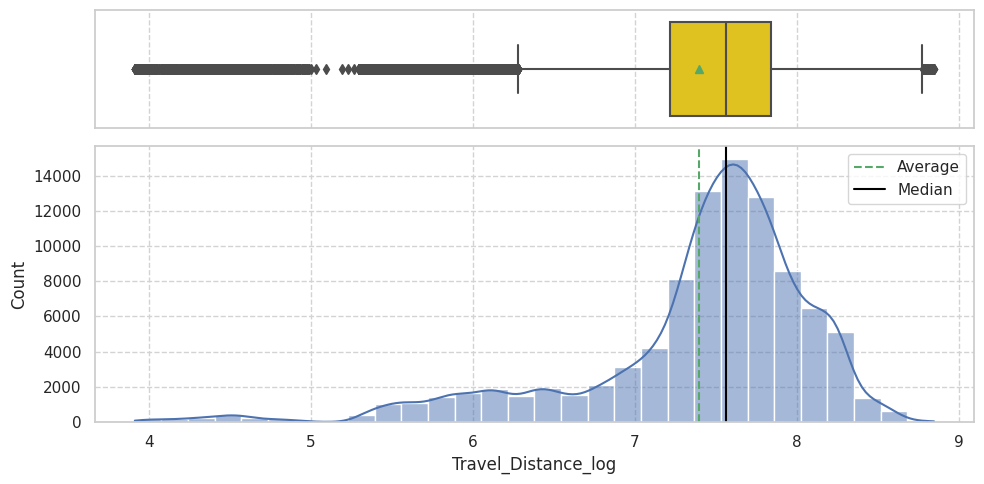

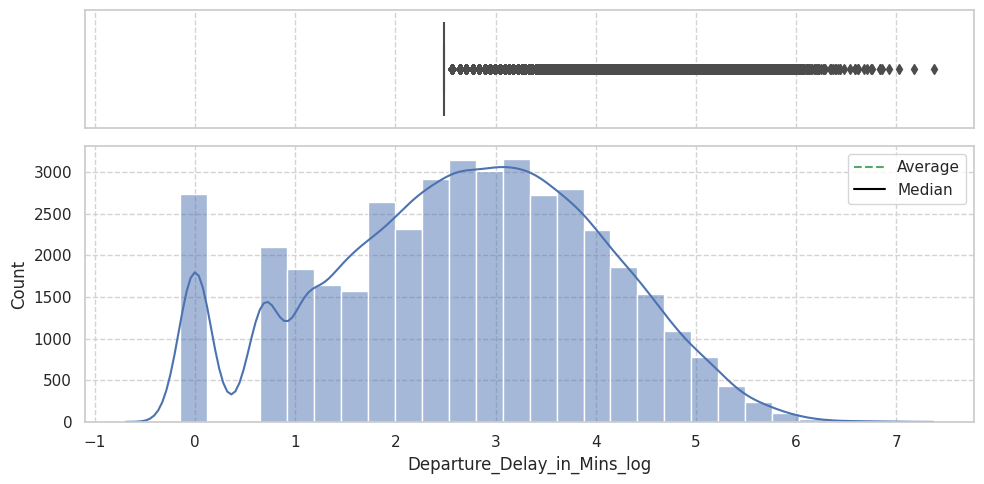

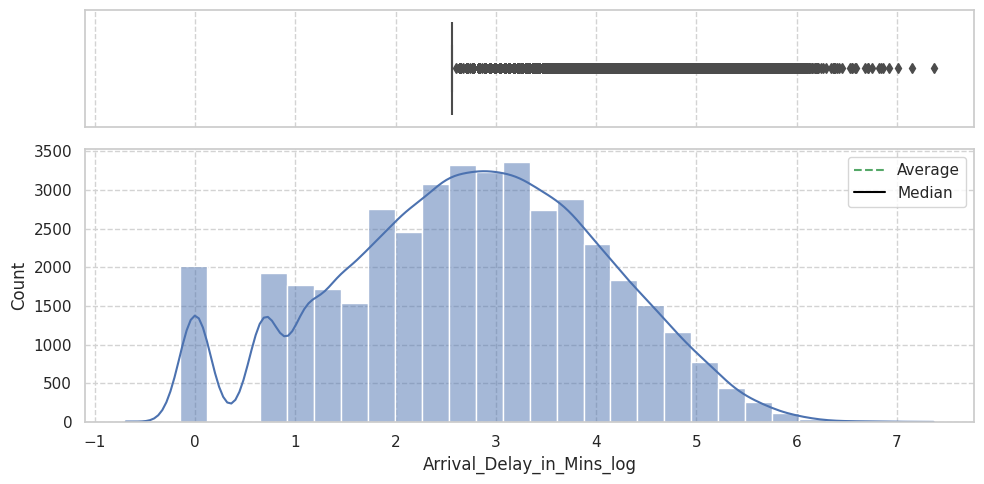

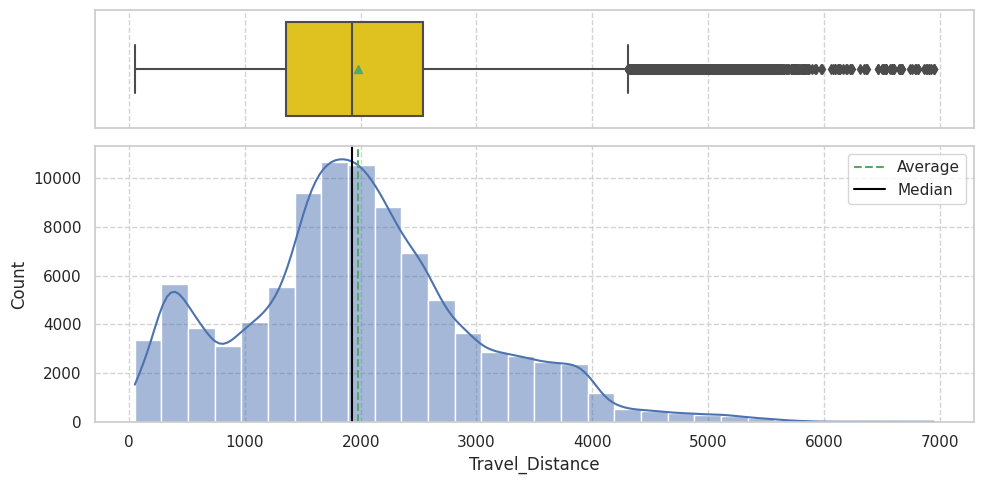

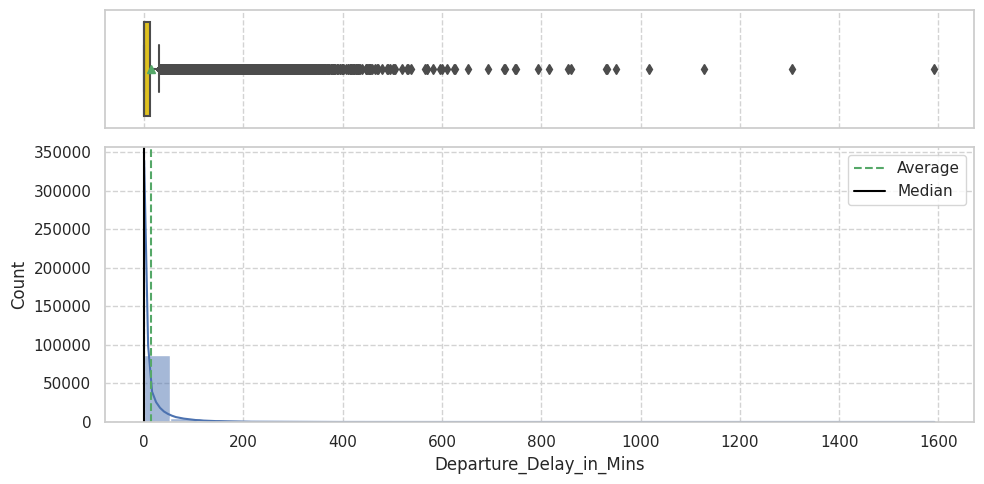

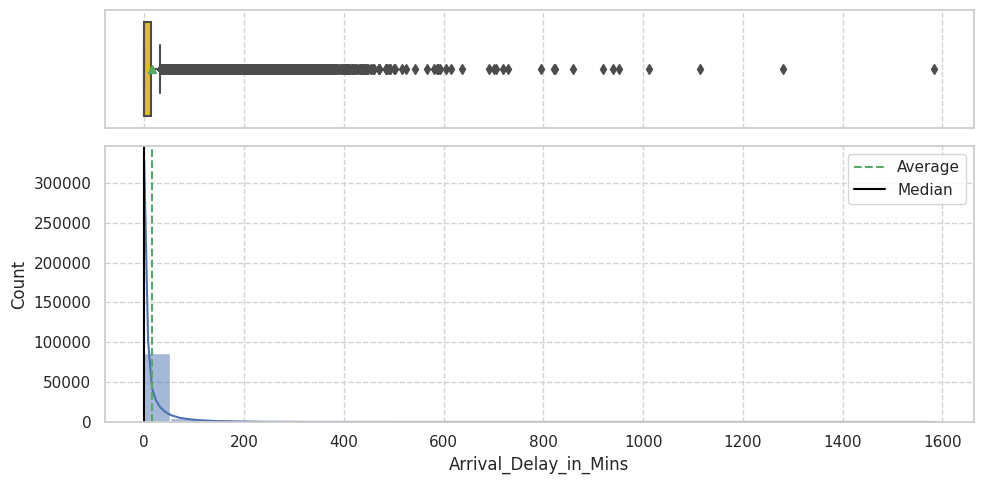

In [ ]:
# # # # #Let's plot the other relevant numerical data on a normal scale
hist_plot(data, numeric_variables_list,bins=30)

## **12.3 Categorical variables univariate analysis**

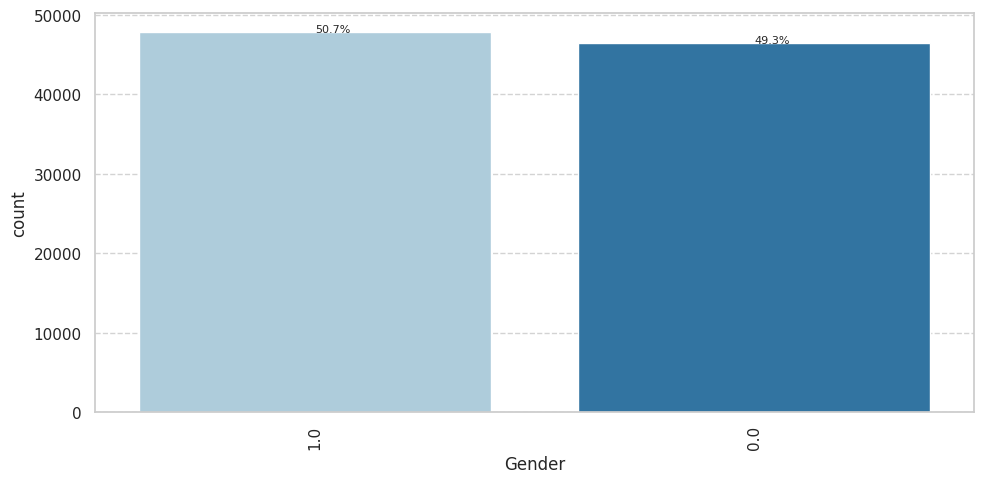

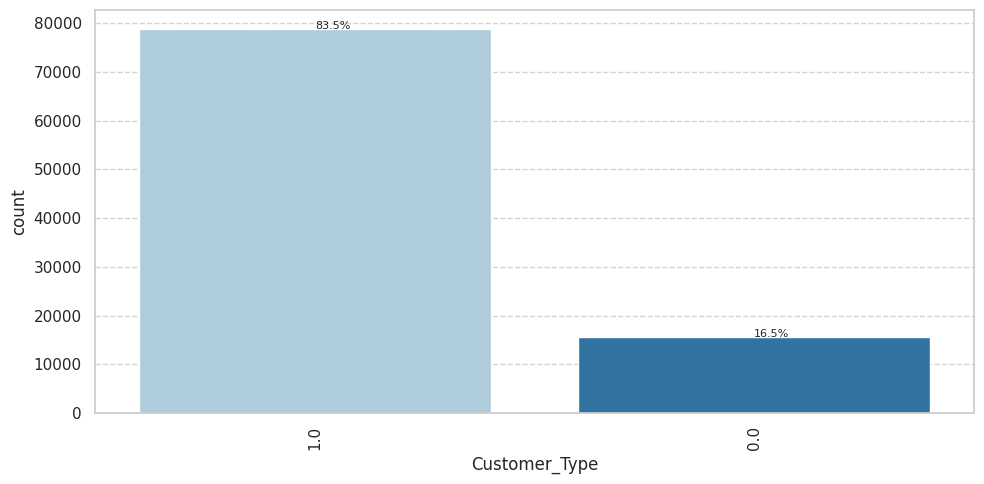

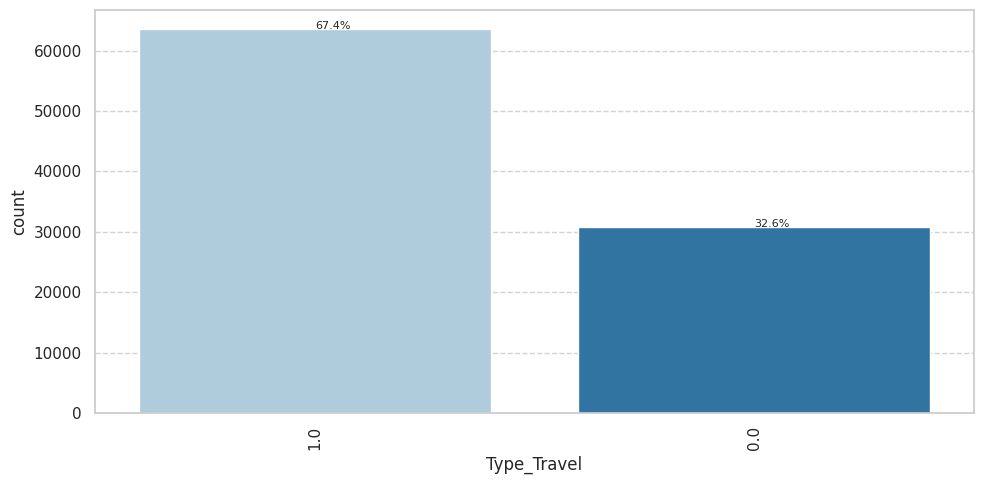

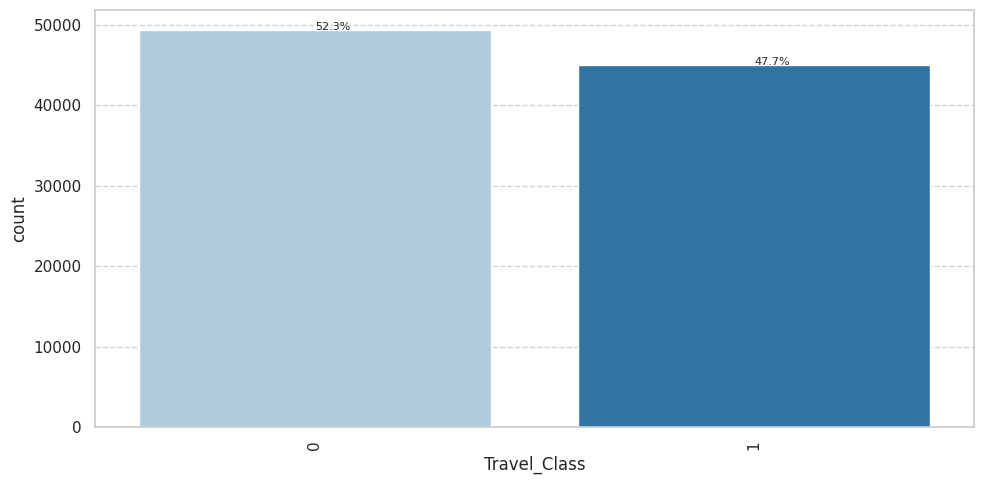

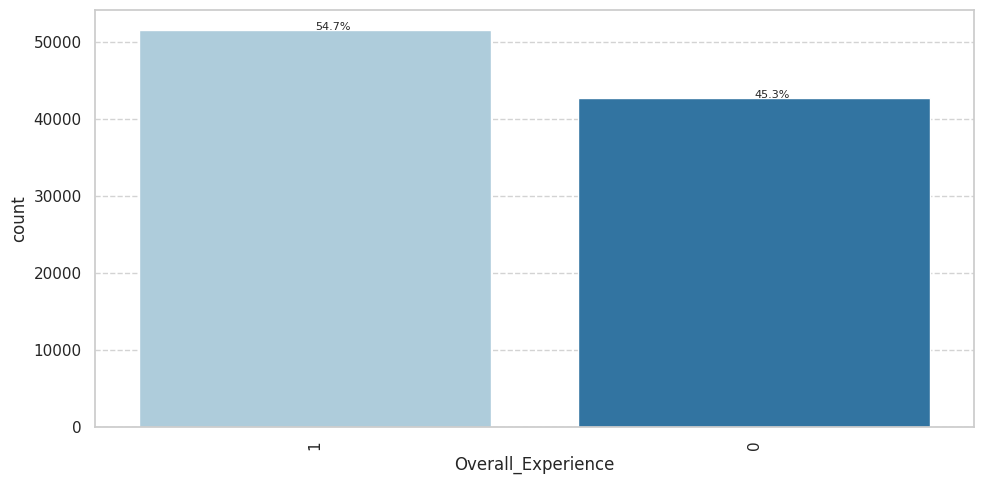

...

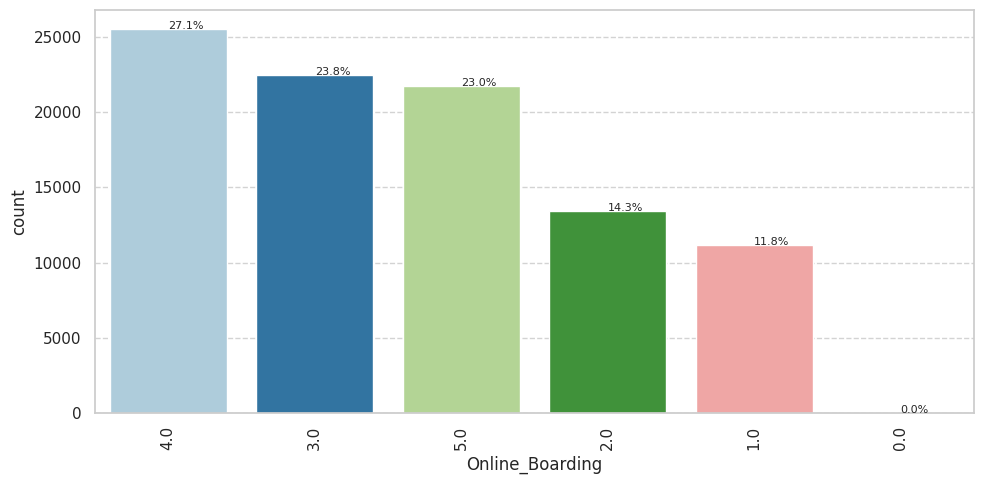

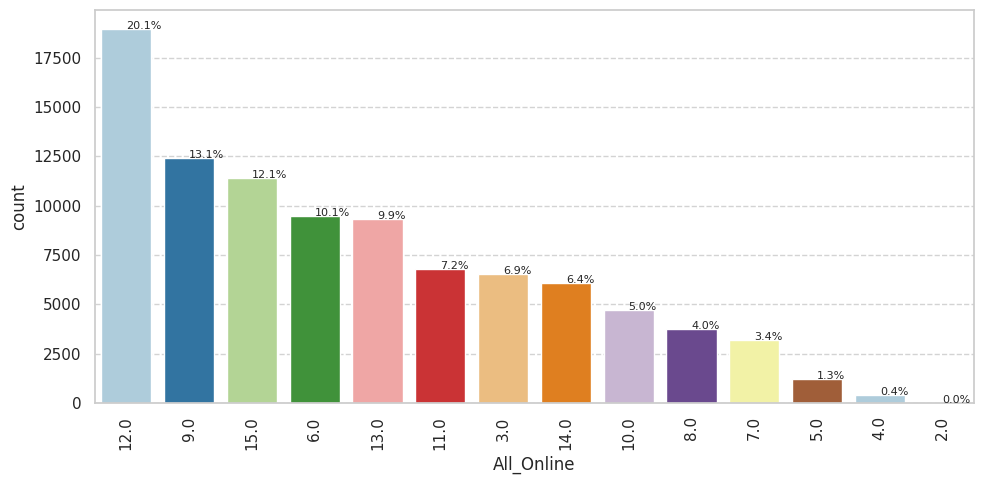

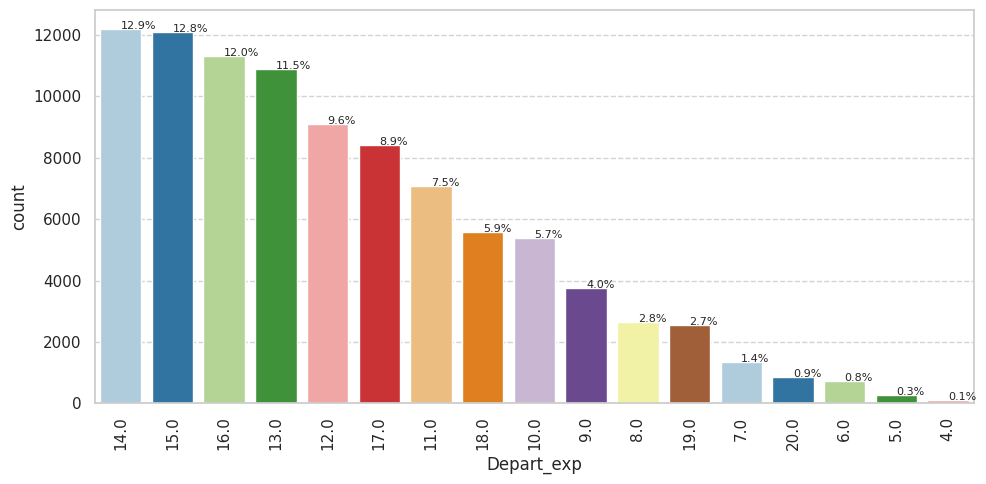

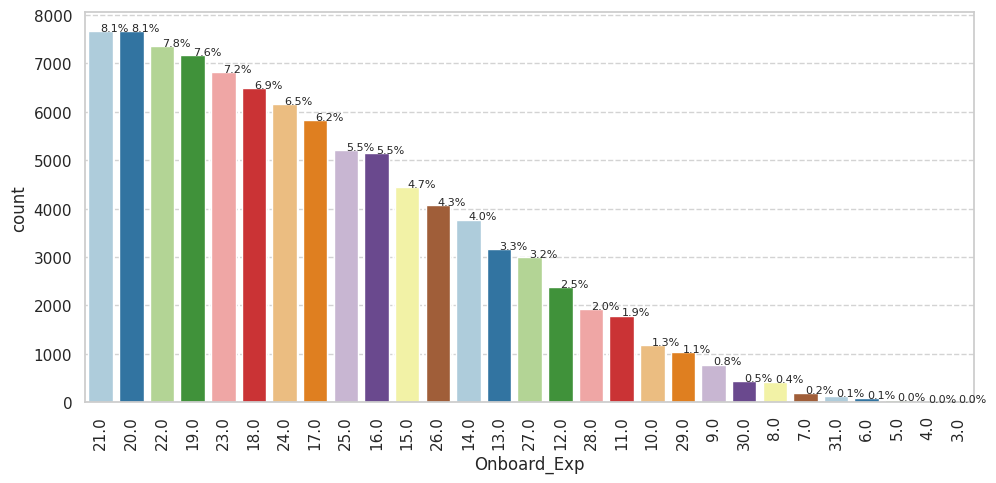

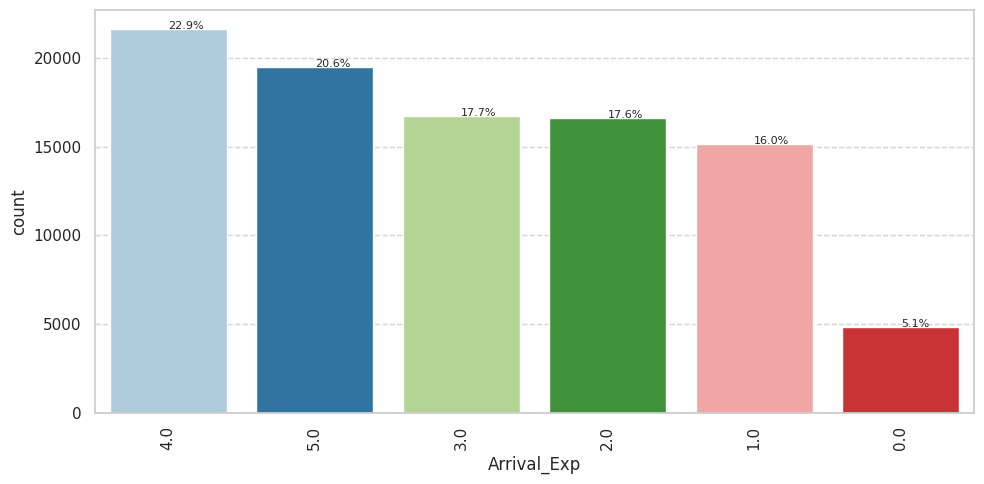

In [ ]:
categorical_variables_list = ['Gender',
                              'Customer_Type',
                              'Type_Travel',
                              'Travel_Class',
                              'Overall_Experience',
                              'Seat_Comfort',
                              'Seat_Class',
                              'Arrival_Time_Convenient',
                              'Catering',
                              'Platform_Location',
                              'Onboard_Wifi_Service',
                              'Onboard_Entertainment',
                              'Online_Support',
                              'Ease_of_Online_Booking',
                              'Onboard_Service',
                              'Legroom',
                              'Baggage_Handling',
                              'CheckIn_Service',
                              'Cleanliness',
                              'Online_Boarding',
                              'All_Online',
                              'Depart_exp',
                              'Onboard_Exp',
                              'Arrival_Exp']

# # #Select relevant categorical data
bar_plot(data, categorical_variables_list)

# **13. Bivariate Analysis**

## **13.1 Function for Bivariate analyses**

In [ ]:
# Function to plot stacked bar plots

def stacked_barplot(data, predictor, target):
    """
    # Print the category counts and plot a stacked bar chart
    # data: dataframe
    # predictor: independent variable
    # target: target variable
    # """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab= pd.crosstab(data[predictor], data[target])
    axs=tab.plot(kind = "bar", stacked = True, figsize = (count + 1, 5))
    plt.legend(loc = "upper left", frameon = False, bbox_to_anchor = (1, 1), title=target)
    plt.xticks(rotation=90)                                                                       # Customize the x axis labels by rotating them by 45 degrees

  #Annotate each bar chart with its percentage
    for p in axs.patches:
        ratio = '{:.1f}%'.format(100 * p.get_height() / len(data[predictor]))                           # Calculate the ratio of each category
        x = p.get_x() + p.get_width() / 2                                                         # Determine the x coordinate of the annotation text
        y = p.get_y() + p.get_height()                                                            # Determine the y coordinate of the annotation text
        axs.annotate(ratio, (x, y), size = 7)                                                      # Display the ratio on top of each bar


    plt.show()

## **13.2 Correlation analysis with heatmap**

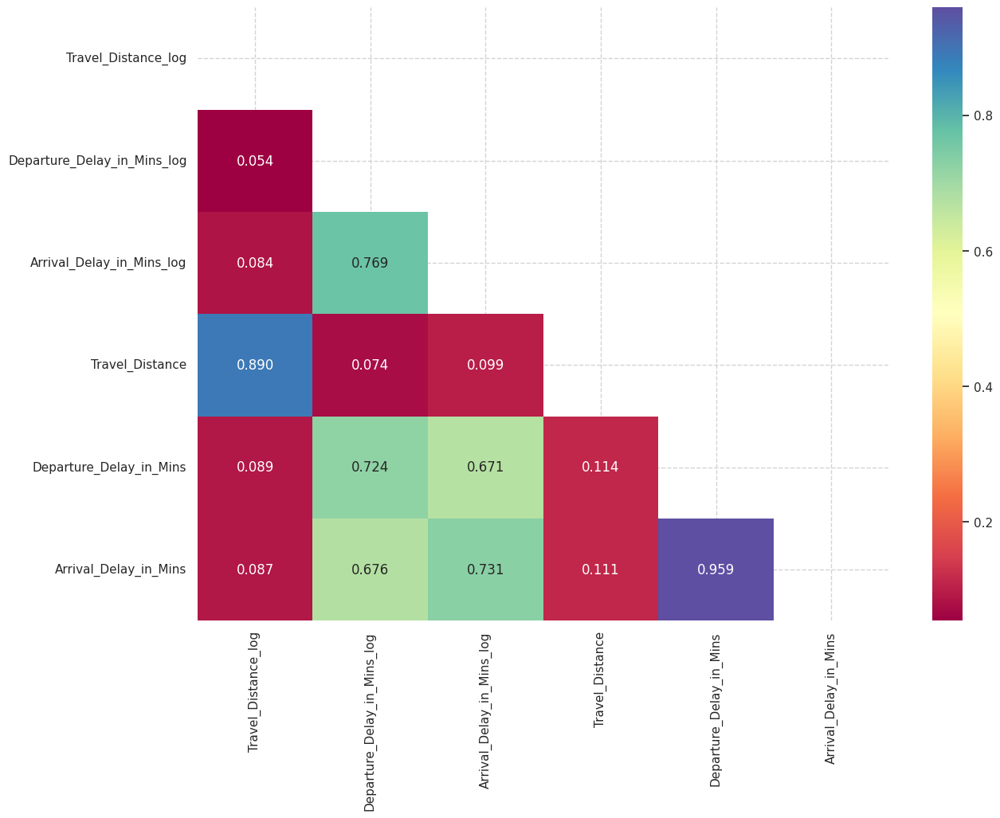

In [ ]:

# Finding the linear correlations between the numerical variables of the dataset
corrmat = data[numeric_variables_list].corr()

# Plot the correlation heatmap
plt.figure(figsize = (14, 10))
sns.heatmap(corrmat, annot = True, cmap = 'Spectral',
        fmt = ".3f",
        xticklabels = corrmat.columns,
        yticklabels = corrmat.columns,
        mask=np.triu(corrmat))
plt.xticks(rotation = 90);



## **13.3 Correlation analysis with pairplot**

<Figure size 3000x2000 with 0 Axes>

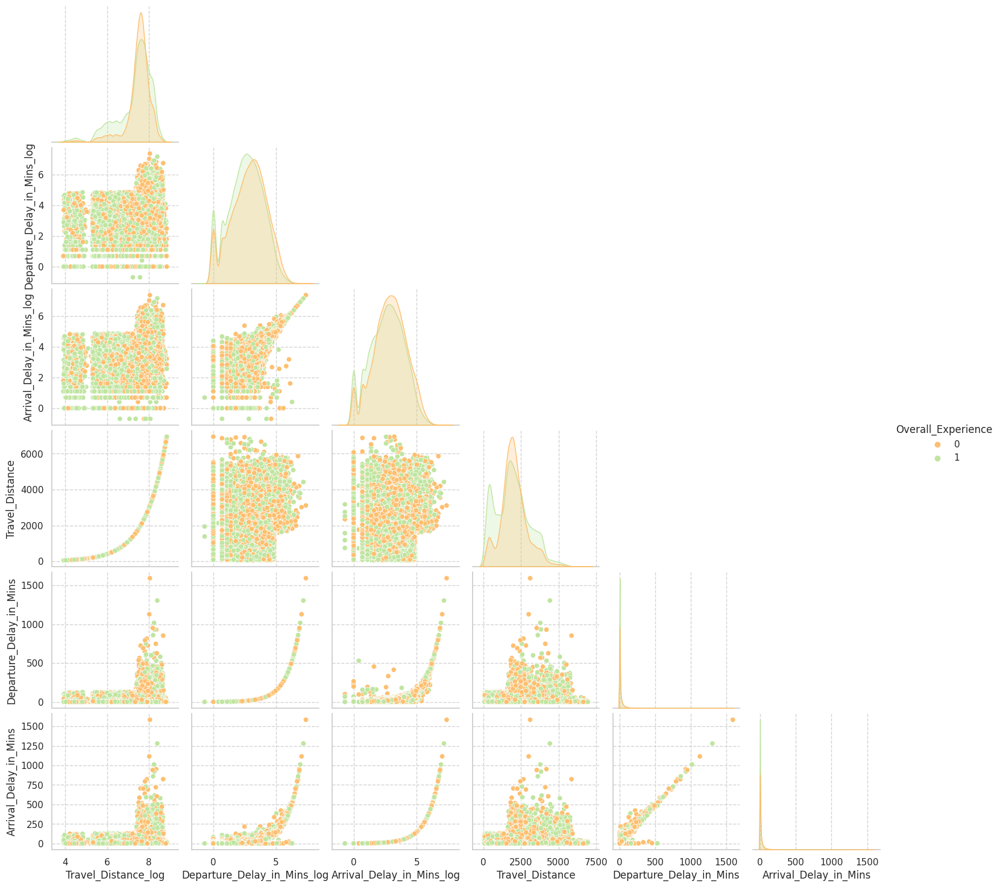

<Figure size 3000x2000 with 0 Axes>

In [ ]:
# # Let's visualize the correlation between the features having significant correlations with the dependent variable
sns.pairplot(data=data, vars=numeric_variables_list,corner=True, hue='Overall_Experience', palette='Spectral')
plt.xticks(rotation=90)
plt.figure(figsize=(30,20))

## **13.4 Correlation analysis with boxplot**

<Figure size 3000x2000 with 0 Axes>

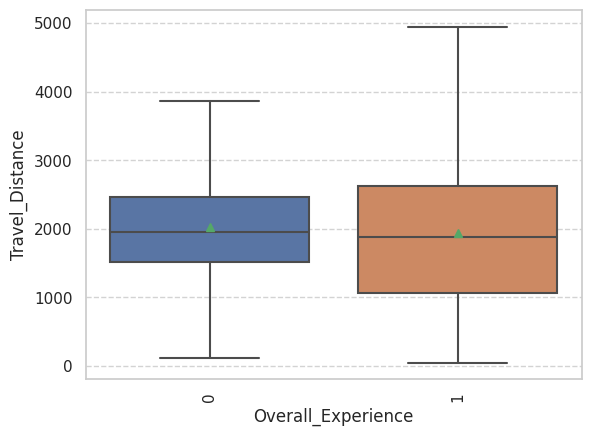

<Figure size 3000x2000 with 0 Axes>

In [ ]:
# Let's visualize the correlation between Travel distance and overall experience
sns.boxplot(data=data, y='Travel_Distance', x='Overall_Experience',showmeans=True, showfliers = False)
plt.xticks(rotation=90)
plt.figure(figsize=(30,20))

<Figure size 3000x2000 with 0 Axes>

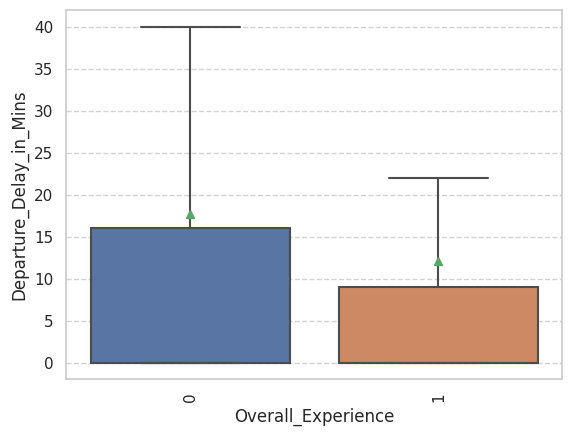

<Figure size 3000x2000 with 0 Axes>

In [ ]:
# Let's visualize the correlation between Departure delay and overall experience
sns.boxplot(data=data, y='Departure_Delay_in_Mins', x='Overall_Experience',showmeans=True, showfliers = False)
plt.xticks(rotation=90)
plt.figure(figsize=(30,20))

<Figure size 3000x2000 with 0 Axes>

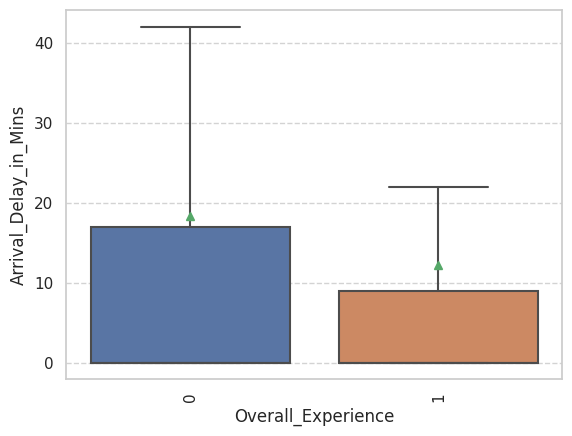

<Figure size 3000x2000 with 0 Axes>

In [ ]:
# Let's visualize the correlation between Departure delay and overall experience
sns.boxplot(data=data, y='Arrival_Delay_in_Mins', x='Overall_Experience',showmeans=True, showfliers = False)
plt.xticks(rotation=90)
plt.figure(figsize=(30,20))

<Figure size 3000x2000 with 0 Axes>

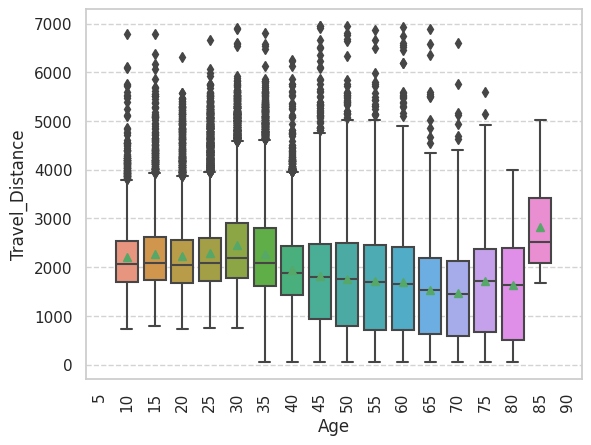

<Figure size 3000x2000 with 0 Axes>

In [ ]:
# Let's visualize the correlation between Age class and overall experience
sns.boxplot(data=data, x='Age', y='Travel_Distance',showmeans=True, showfliers = True)
plt.xticks(rotation=90)
plt.figure(figsize=(30,20))

## **13.5 Correlation analysis with stacked barplot**

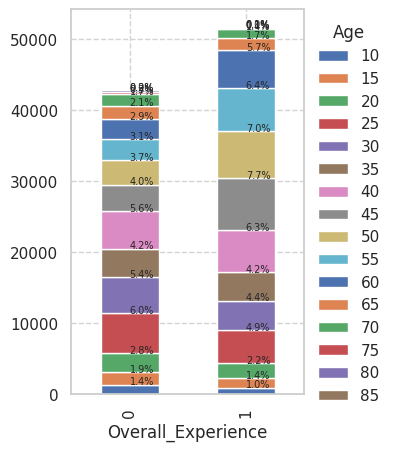

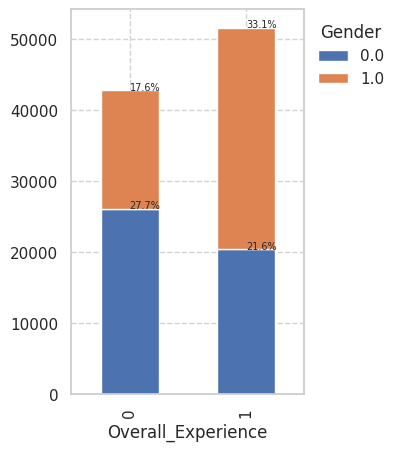

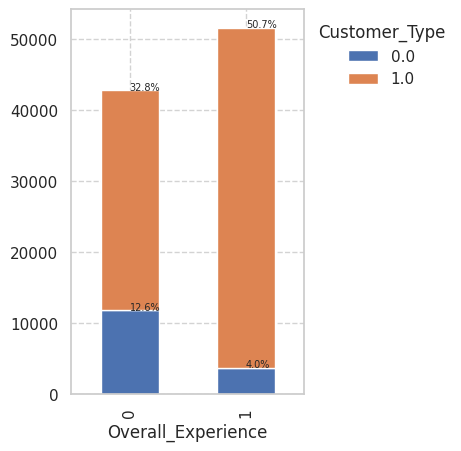

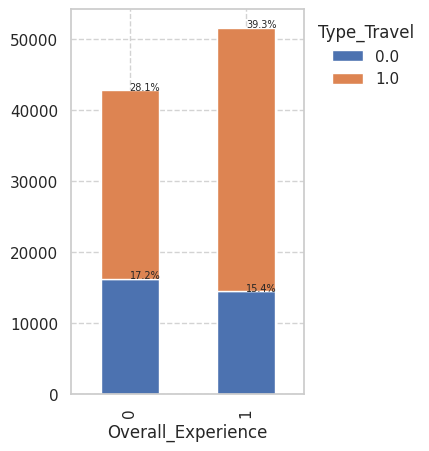

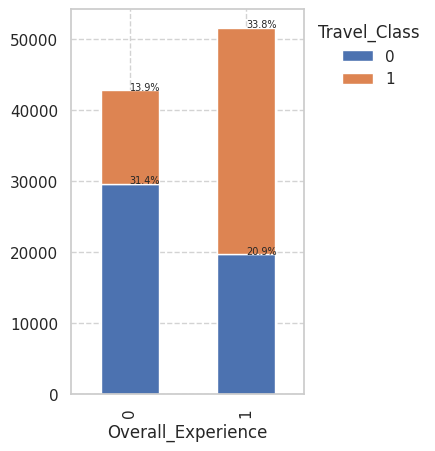

...

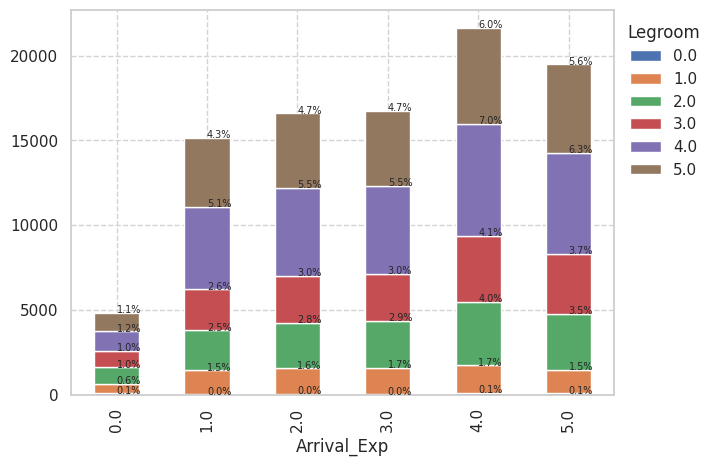

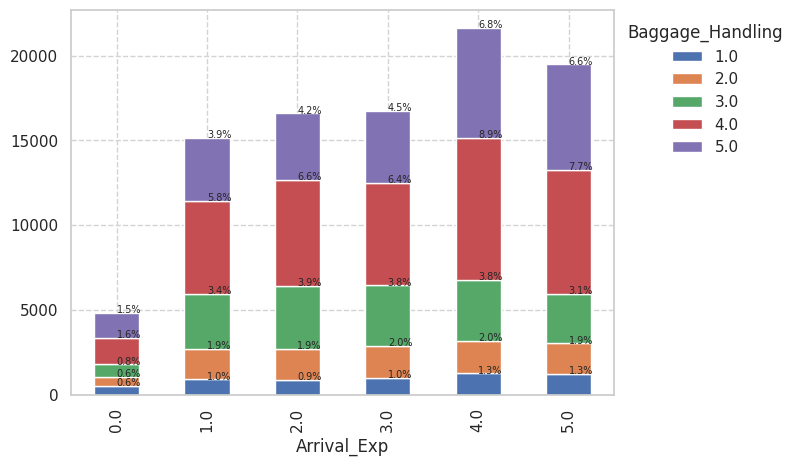

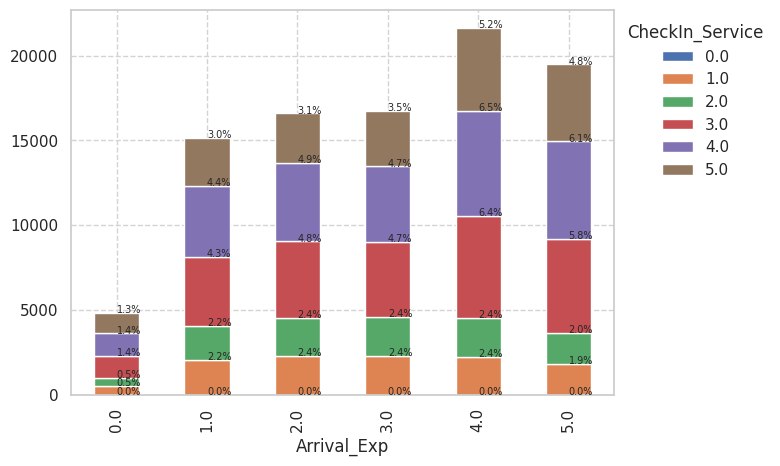

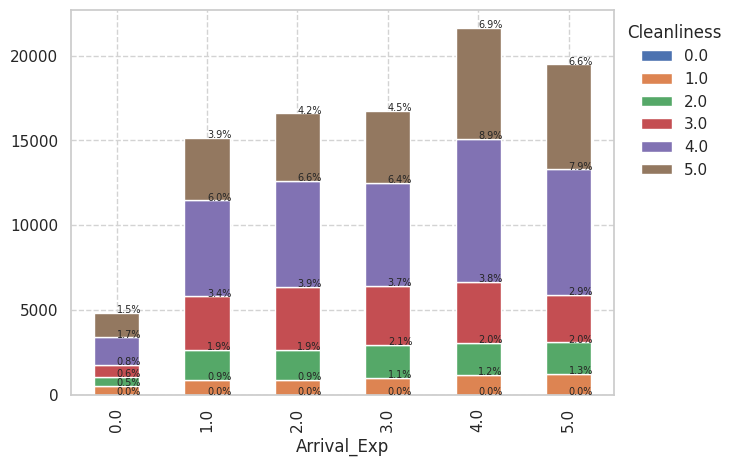

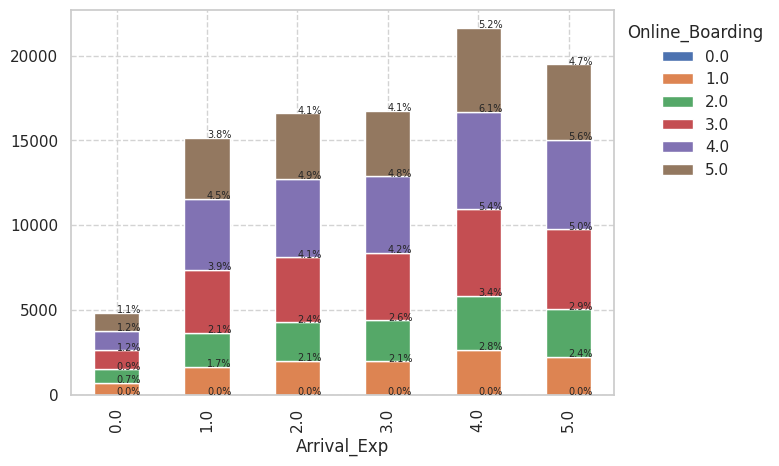

In [ ]:
categorical_variables_x = ['Overall_Experience',
                              'Age',
                              'Gender',
                              'Customer_Type',
                              'Type_Travel',
                              'Travel_Class',
                              'All_Online',
                              'Depart_exp',
                              'Onboard_Exp',
                              'Arrival_Exp'
                              ]
categorical_variables_y = ['Overall_Experience',
                              'Age',
                              'Gender',
                              'Customer_Type',
                              'Type_Travel',
                              'Travel_Class',
                              'Seat_Comfort',
                              'Seat_Class',
                              'Arrival_Time_Convenient',
                              'Catering',
                              'Platform_Location',
                              'Onboard_Wifi_Service',
                              'Onboard_Entertainment',
                              'Online_Support',
                              'Ease_of_Online_Booking',
                              'Onboard_Service',
                              'Legroom',
                              'Baggage_Handling',
                              'CheckIn_Service',
                              'Cleanliness',
                              'Online_Boarding'
                              ]



for idx, cat_var_x in enumerate(categorical_variables_x):
  x= cat_var_x

  for idy, cat_var_y in enumerate(categorical_variables_y):
    if (idy != idx):
      y= cat_var_y
      stacked_barplot(data, x, y)

# **14. Multivariate analysis**

## **14.1 Catplot of Seat Comfort per Type_Travel, per Travel_Class and per gender**

<Figure size 3000x3000 with 0 Axes>

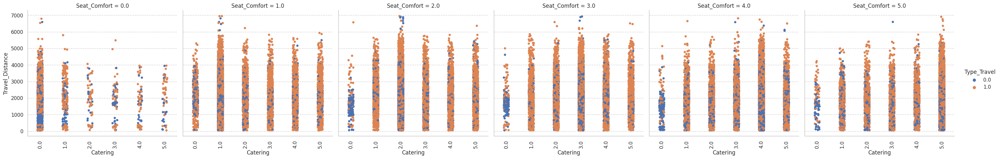

<Figure size 3000x3000 with 0 Axes>

In [ ]:
# Let's visualize the correlation between prices of the cars per brand and per owner_type up to the year 2019.
g=sns.catplot(kind='strip', data=data, x='Catering', y = 'Travel_Distance', hue='Type_Travel', col='Seat_Comfort')
g.set_xticklabels(rotation=90)
plt.figure(figsize=(30,30))


## **14.2 Catplot of Catering per Type_Travel, per Travel_Distance and per gender**

<Figure size 3000x3000 with 0 Axes>

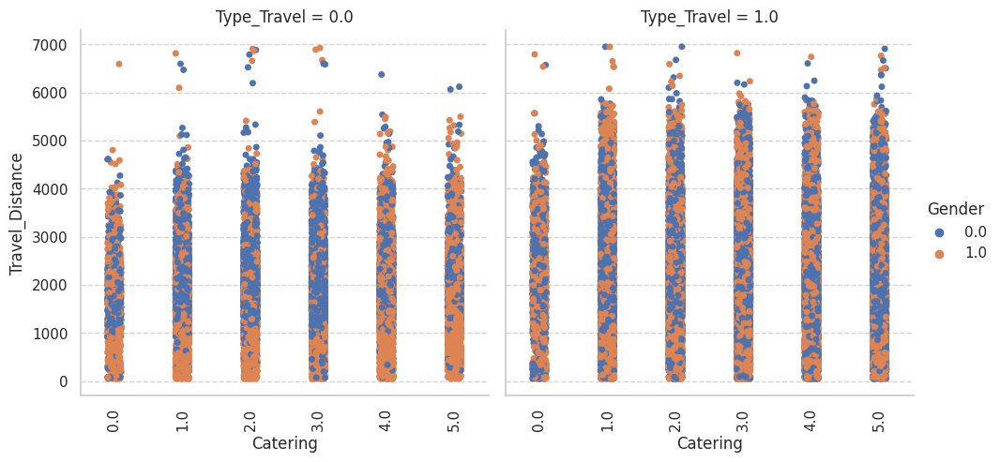

<Figure size 3000x3000 with 0 Axes>

In [ ]:
# Let's visualize the correlation between prices of the cars per brand and per owner_type up to the year 2019.
g=sns.catplot(kind='strip', data=data, x='Catering', y = 'Travel_Distance', hue='Gender', col='Type_Travel')
g.set_xticklabels(rotation=90)
plt.figure(figsize=(30,30))


# **15. Data preparation and building machine learning model**

##**15.1 Manual research**

In [ ]:
cpt=cpt+1
### Removal of unrelevant variables from data set
# # Removing unrelevant independent variables
# try:
data.drop('ID',axis=1, inplace=True)
data.drop('Departure_Delay_in_Mins_log',axis=1, inplace=True)
data.drop('Arrival_Delay_in_Mins_log',axis=1, inplace=True)
data.drop('Travel_Distance_log',axis=1, inplace=True)

data.drop('Departure_Delay_in_Mins',axis=1, inplace=True)
data.drop('Arrival_Delay_in_Mins',axis=1, inplace=True)
data.drop('Travel_Distance',axis=1, inplace=True)

# Removing unrelevant independent variables
data_test.drop('ID',axis=1, inplace=True)
### Creating dummy variables for the categorical variables
# Creating the list of columns for which we need to create the dummy variables
to_get_dummies_for_train = [
                              'Gender',
                              'Customer_Type',
                              'Type_Travel',
                              'Travel_Class',
                              'Seat_Comfort',
                              'Seat_Class',
                              'Arrival_Time_Convenient',
                              'Catering',
                              'Platform_Location',
                              'Onboard_Wifi_Service',
                              'Onboard_Entertainment',
                              'Online_Support',
                              'Ease_of_Online_Booking',
                              'Onboard_Service',
                              'Legroom',
                              'Baggage_Handling',
                              'CheckIn_Service',
                              'Cleanliness',
                              'Online_Boarding',
                              'All_Online',
                              'Depart_exp',
                              'Onboard_Exp',
                              'Arrival_Exp'
                              ]
# Creating dummy variables for the categorical variables
data = pd.get_dummies(data, columns = to_get_dummies_for_train,drop_first = True)

# Creating the list of columns for which we need to create the dummy variables
to_get_dummies_for_test_hcktn = [
                              'Gender',
                              'Customer_Type',
                              'Type_Travel',
                              'Travel_Class',
                              'Seat_Comfort',
                              'Seat_Class',
                              'Arrival_Time_Convenient',
                              'Catering',
                              'Platform_Location',
                              'Onboard_Wifi_Service',
                              'Onboard_Entertainment',
                              'Online_Support',
                              'Ease_of_Online_Booking',
                              'Onboard_Service',
                              'Legroom',
                              'Baggage_Handling',
                              'CheckIn_Service',
                              'Cleanliness',
                              'Online_Boarding',
                              'All_Online',
                              'Depart_exp',
                              'Onboard_Exp',
                              'Arrival_Exp'
                              ]
# Creating dummy variables for the categorical variables
data_test = pd.get_dummies(data_test, columns = to_get_dummies_for_test_hcktn,drop_first = True)

# except:
#     pass


### Separate independent variables (Predictors) from target variable
### Extract the target (dependent/outcome) variable
# We are extracting the outcome variable separately
x = data.drop('Overall_Experience',axis=1)
y = data['Overall_Experience']
x_data_test = data_test

### Splitting the dataset into train and test datasets
x_train_local, x_test_local, y_train_local, y_test_local = train_test_split(x, y, train_size = 0.8, test_size = 0.2, shuffle = True, random_state = 1)

# Checking the shape of the train and test data
print("Shape of Training set predictors : ", x_train_local.shape)
print("Shape of test set predictors: ", x_test_local.shape)

print("Shape of Training set target: ", y_train_local.shape)
print("Shape of test set target: ", y_test_local.shape)


### Scaling the numerical variables
# Creating an instance of the MinMaxScaler
scaler = MinMaxScaler() #StandardScaler()

# Applying fit_transform on the training features data
x_train_scaled_local = scaler.fit_transform(x_train_local)
x_test_scaled_local = scaler.fit_transform(x_test_local)

# Applying fit_transform on the hackathon features data
print("Shape of testing set predictors : ", x_data_test.shape)
x_test_scaled_hcktn = scaler.fit_transform(x_data_test)


# The above scaler returns the data in array format, below we are converting it back to pandas DataFrame
x_train_scaled_local = pd.DataFrame(x_train_scaled_local, index = x_train_local.index, columns = x_train_local.columns)
x_test_scaled_local = pd.DataFrame(x_test_scaled_local, index = x_test_local.index, columns = x_test_local.columns)

# The above scaler returns the data in array format, below we are converting it back to pandas DataFrame
x_test_scaled_hcktn = pd.DataFrame(x_test_scaled_hcktn, index = x_data_test.index, columns = x_data_test.columns)


#find the columns that are different in data.columns and data_test.columns
dif_dta = pd.DataFrame(set(x.columns).symmetric_difference(set(x_data_test.columns)))
data_size=data.columns.shape[0]
data_test_size=data_test.columns.shape[0]

for idx, i in dif_dta.iterrows():
    x_test_scaled_hcktn[dif_dta.loc[idx]] = 0

Shape of Training set predictors :  (75503, 137)
Shape of test set predictors:  (18876, 137)
Shape of Training set target:  (75503,)
Shape of test set target:  (18876,)
Shape of testing set predictors :  (35602, 135)


In [ ]:
### Building classifier models

# Observed data
x_train_st_local = x_train_scaled_local
x_test_st_local = x_test_scaled_local
y_observed_train_local = y_train_local
y_observed_test_local = y_test_local

# Instantiate the models
models = []
models.append(('HistGradientBoostingClassifier',HistGradientBoostingClassifier(random_state=None, learning_rate = 0.1, max_depth=5, max_iter=100)))


for idx, model_i in enumerate(models): #accuracy on train set from training data
    added_perf = dict()
    mod_i = model_i[1]

    mod_i.fit(x_train_st_local , y_observed_train_local)

    folds = RepeatedStratifiedKFold(n_splits=10, n_repeats=1, random_state=1)

    train_accuracy = cross_val_score(mod_i, x_train_st_local, y_observed_train_local, scoring="accuracy", cv=folds, n_jobs=-1, error_score='raise').mean()
    print('train_accuracy [%]:',train_accuracy*100)

    test_accuracy = cross_val_score(mod_i, x_test_st_local, y_observed_test_local, scoring="accuracy", cv=folds, n_jobs=-1, error_score='raise').mean()
    print('test_accuracy [%]:',test_accuracy*100)

    x_test_scaled_hcktn = x_test_scaled_hcktn[x_train_st_local.columns]

    y_pred_train_hcktn = mod_i.predict(x_test_scaled_hcktn)

    result_final = pd.DataFrame(data={'ID': range(99900001,99935603), 'Overall_Experience': y_pred_train_hcktn}).set_index('ID').sort_index(ascending=True)
    result_final.to_csv("/content/drive/MyDrive/Colab_Notebooks/Hackathon/Shinkansen_sentinels_HGB0_"+str(2*cpt+2)+".csv", index = True)
    print('Reference file N°=',2*cpt+2)
    cpt=cpt+1

train_accuracy [%]: 94.31413934911477
test_accuracy [%]: 93.80692663001986
Reference file N°= 8


##**15.2 Bayesian optimization**

###**15.2.1 BayesSearchCV**

In [ ]:
# ### Building classifier models

# # Observed data
# x_train_st_local = x_train_scaled_local
# x_test_st_local = x_test_scaled_local
# y_observed_train_local = y_train_local
# y_observed_test_local = y_test_local

# optimizer = BayesSearchCV(
#     RandomForestClassifier(random_state=100),
#     {
#         'n_estimators': (200, 230),
#         'max_depth' : (5, 20)
#     },
#     random_state=40,
#     cv=10,
#     n_jobs=-1,
#     n_iter=50,
#     verbose=1,
# )

# # executes bayesian optimization
# bopt = optimizer.fit(x_train_st_local, y_observed_train_local)

# #Evaluate accuracy

# folds = RepeatedStratifiedKFold(n_splits=10, n_repeats=1, random_state=1)

# train_accuracy = cross_val_score(bopt, x_train_st_local, y_observed_train_local, scoring="accuracy", cv=5, n_jobs=-1, error_score='raise').mean()
# print('train_accuracy:',train_accuracy)

# test_accuracy = cross_val_score(bopt, x_test_st_local, y_observed_test_local, scoring="accuracy", cv=5, n_jobs=-1, error_score='raise').mean()
# print('test_accuracy:',test_accuracy)



# perfs=[]
# added_perf = dict()

# added_perf['train_accuracy_CV'] = '%.5f (%.5f)' % (np.mean(train_accuracy_CV), np.std(train_accuracy_CV))
# added_perf['test_accuracy_CV'] = '%.5f (%.5f)' % (np.mean(test_accuracy_CV), np.std(test_accuracy_CV))
# added_perf['Parameters'] = bopt.get_params()
# perfs.append(added_perf)

# #Display results with 5 decimals
# pd.options.display.float_format = '{:,.5f}'.format
# perfs

###**15.2.2 BayesianOptimization**

In [ ]:
# Observed data
x_train_st_local = x_train_scaled_local
x_test_st_local = x_test_scaled_local
y_observed_train_local = y_train_local
y_observed_test_local = y_test_local


# Model building
def gbm_cl_bo(max_depth, learning_rate, n_estimators, subsample):
    params_gbm = {}
    params_gbm['max_depth'] = round(max_depth)
    params_gbm['learning_rate'] = learning_rate
    params_gbm['n_estimators'] = round(n_estimators)
    params_gbm['subsample'] = subsample

    train_accuracy = cross_val_score(GradientBoostingClassifier(random_state=123, **params_gbm),x_train_st_local, y_observed_train_local, scoring="accuracy", cv=5, error_score='raise').mean()
    print('train_accuracy:',train_accuracy)

    test_accuracy = cross_val_score(GradientBoostingClassifier(random_state=123, **params_gbm),x_test_st_local, y_observed_test_local, scoring="accuracy", cv=5, error_score='raise').mean()
    print('test_accuracy:',test_accuracy)

    return test_accuracy


# Run Bayesian Optimization
start = time.time()
params_gbm ={
    'max_depth':(3, 10),
    'learning_rate':(0.01, 1),
    'n_estimators':(80, 150),
    'subsample': (0.8, 1)
}

gbm_bo = BayesianOptimization(gbm_cl_bo, params_gbm, random_state=111)
gbm_bo.maximize(init_points=20, n_iter=4)
print('It takes %s minutes' % ((time.time() - start)/60))


params_gbm = gbm_bo.max['params']
params_gbm


|   iter    |  target   | learni... | max_depth | n_esti... | subsample |
-------------------------------------------------------------------------
train_accuracy: 0.9441082328217376
train_accuracy: 0.9333547676506904
| 1         | 0.9334    | 0.616     | 4.183     | 110.5     | 0.9539    |
train_accuracy: 0.9444658074922454
train_accuracy: 0.9374340273880346
| 2         | 0.9374    | 0.3024    | 4.044     | 81.57     | 0.884     |
train_accuracy: 0.9484921344185354
train_accuracy: 0.9422548686721293
| 3         | 0.9423    | 0.2463    | 5.364     | 149.3     | 0.8475    |
train_accuracy: 0.9511012787627326
train_accuracy: 0.9420960124593106
| 4         | 0.9421    | 0.09038   | 7.687     | 123.5     | 0.8549    |
train_accuracy: 0.945578317474699
train_accuracy: 0.936851147715793
| 5         | 0.9369    | 0.4716    | 3.829     | 85.18     | 0.9802    |
train_accuracy: 0.9476179867918049
train_accuracy: 0.9403477522729824
| 6         | 0.9403    | 0.796     | 8.884     | 137.1     | 0.

{'learning_rate': 0.2462953198339816,
 'max_depth': 5.363593343221547,
 'n_estimators': 149.34987252416153,
 'subsample': 0.8475452907800046}

##**15.3 Halving Search**

In [ ]:
# Observed data
x_train_st_local = x_train_scaled_local
x_test_st_local = x_test_scaled_local
y_observed_train_local = y_train_local
y_observed_test_local = y_test_local

clf = RandomForestClassifier(random_state=0)
np.random.seed(0)
param_distributions = {"max_depth": randint(5, 100),
                       "min_samples_split": randint(5, 50)}

param_grid = {"max_depth": [5, 50],
              "min_samples_split": [5, 50]}

search = HalvingRandomSearchCV(clf, param_distributions,
                               resource='n_estimators',
                               max_resources=300,
                               random_state=0).fit(x_train_st_local, y_observed_train_local)

grid_search = HalvingGridSearchCV(clf, param_grid,
                                  resource='n_estimators',
                                  max_resources=300,
                                  random_state=0).fit(x_train_st_local, y_observed_train_local)

res_dict = search.best_params_
grid_res_dict = grid_search.best_params_

print('res_dict',res_dict)
print('grid_res_dict',grid_res_dict)
print('=='*50)

clf_rdm = RandomForestClassifier(random_state=0,
                                       max_depth = res_dict['max_depth'],
                                       min_samples_split = res_dict['min_samples_split'],
                                       n_estimators = res_dict['n_estimators'])

clf_grid = RandomForestClassifier(random_state=0,
                                       max_depth = grid_res_dict['max_depth'],
                                       min_samples_split = grid_res_dict['min_samples_split'],
                                       n_estimators = grid_res_dict['n_estimators'])

folds = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)


print('HalvingRandomSearchCV - HRS')

Train_accuracy_HRS=cross_val_score(clf_rdm, x_train_st_local, y_observed_train_local, scoring="accuracy", cv=folds).mean()
print('Train_accuracy_HRS',Train_accuracy_HRS)

Test_accuracy_HRS=cross_val_score(clf_rdm, x_test_st_local, y_observed_test_local, scoring="accuracy", cv=folds).mean()
print('Test_accuracy_HRS',Test_accuracy_HRS)

print('=='*50)

print('HalvingGridSearchCV - HGS')

Train_accuracy_HGS=cross_val_score(clf_grid, x_train_st_local, y_observed_train_local, scoring="accuracy", cv=folds).mean()
print('Train_accuracy_HGS',Train_accuracy_HGS)

Test_accuracy_HGS=cross_val_score(clf_grid, x_test_st_local, y_observed_test_local, scoring="accuracy", cv=folds).mean()
print('Test_accuracy_HGS',Test_accuracy_HGS)

res_dict {'max_depth': 40, 'min_samples_split': 7, 'n_estimators': 243}
grid_res_dict {'max_depth': 50, 'min_samples_split': 5, 'n_estimators': 300}
HalvingRandomSearchCV - HRS
Train_accuracy_HRS 0.9414063888735408
Test_accuracy_HRS 0.9229707274572678
HalvingGridSearchCV - HGS
Train_accuracy_HGS 0.942571883378457
Test_accuracy_HGS 0.9250898486971518


##**15.4 Artificial Neural Network classifier**

In [ ]:
backend.clear_session()
#Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(0)
import random
random.seed(0)
tf.random.set_seed(0)

# Observed data
x_train_st_local = x_train_scaled_local
x_test_st_local = x_test_scaled_local
y_observed_train_local = y_train_local
y_observed_test_local = y_test_local

hidden_units1 = 256
hidden_units2 = 128
hidden_units3 = 64

learning_rate = 0.1
nb_epoch = 40
nb_drop = 0.1

activ_func='relu'
# Creating model using the Sequential in tensorflow
model = Sequential([
  # This adds the input layer (by specifying input dimension) AND the first hidden layer (units)

  #Add 1st hidden layer
  Dense(hidden_units1, kernel_initializer='normal', activation=activ_func),
  Dropout(nb_drop),

  #Add 2nd hidden layer
  Dense(hidden_units2, kernel_initializer='normal', activation=activ_func),
  Dropout(nb_drop),

  #Add 3rd hidden layer
  Dense(hidden_units3, kernel_initializer='normal', activation=activ_func),
  Dropout(nb_drop),

  Dense(1, kernel_initializer='normal', activation='linear')
])


model.compile(
    loss='binary_crossentropy',
    optimizer=Adam(learning_rate=learning_rate),
    metrics=['accuracy']
)

# Predict using the independent variables
ann_model = model.fit(x_train_st_local,y_observed_train_local,epochs=nb_epoch,batch_size=128,validation_split=0.1, verbose=1)

score, acc = model.evaluate(x_train_st_local, y_observed_train_local,  batch_size=10)

print('Train score:', score)
print('Train accuracy:', acc)




Epoch 1/40
531/531 [==============================] - 9s 4ms/step - loss: 6.9108 - accuracy: 0.5465 - val_loss: 6.9168 - val_accuracy: 0.5464
Epoch 2/40
531/531 [==============================] - 2s 4ms/step - loss: 6.9117 - accuracy: 0.5468 - val_loss: 6.9168 - val_accuracy: 0.5464
Epoch 3/40
531/531 [==============================] - 2s 4ms/step - loss: 6.9117 - accuracy: 0.5468 - val_loss: 6.9168 - val_accuracy: 0.5464
Epoch 4/40
531/531 [==============================] - 3s 5ms/step - loss: 6.9117 - accuracy: 0.5468 - val_loss: 6.9168 - val_accuracy: 0.5464
Epoch 5/40
531/531 [==============================] - 3s 6ms/step - loss: 6.9117 - accuracy: 0.5468 - val_loss: 6.9168 - val_accuracy: 0.5464
Epoch 6/40
531/531 [==============================] - 2s 4ms/step - loss: 6.9117 - accuracy: 0.5468 - val_loss: 6.9168 - val_accuracy: 0.5464
Epoch 7/40
531/531 [==============================] - 2s 4ms/step - loss: 6.9117 - accuracy: 0.5468 - val_loss: 6.9168 - val_accuracy: 0.5464
Epoch 

# **16 Features importance and visualization**

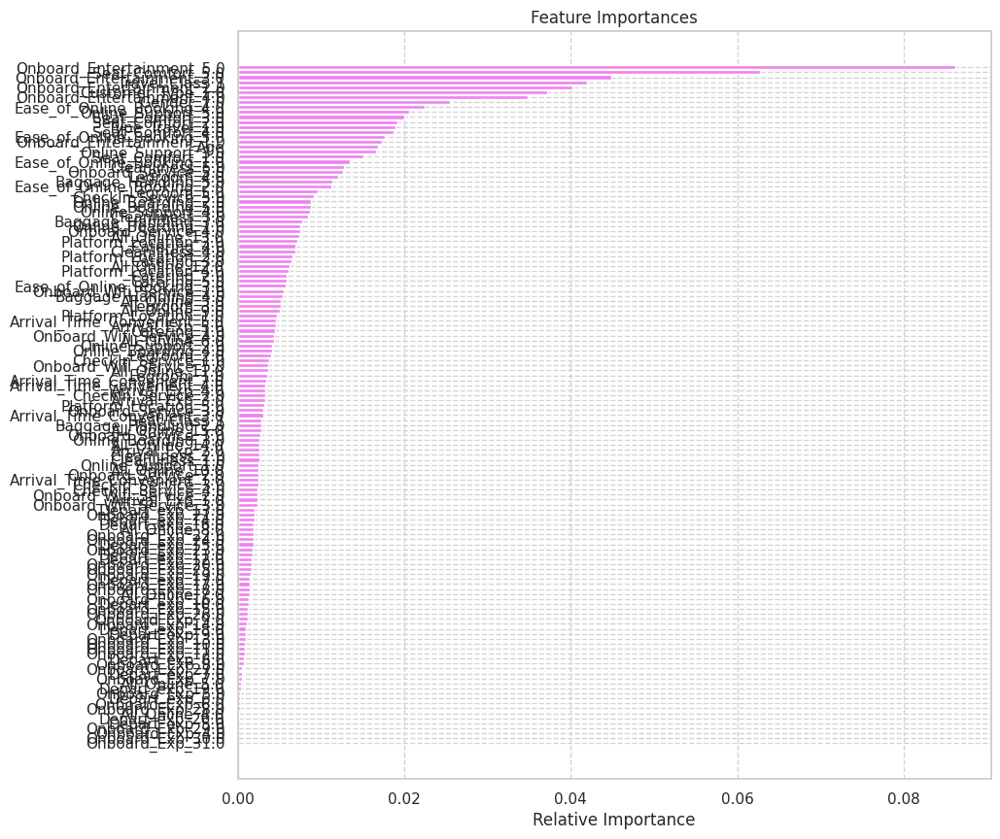

In [ ]:
# Observed data

model = RandomForestClassifier(n_estimators=200, max_depth= 20, max_features= 15, random_state = 100)
model.fit(x_train_st_local, y_observed_train_local)

# Plotting the feature importance
features = list(x_train_st_local.columns)

importances = model.feature_importances_

indices = np.argsort(importances)

plt.figure(figsize = (10, 10))

plt.title('Feature Importances')

plt.barh(range(len(indices)), importances[indices], color = 'violet', align = 'center')

plt.yticks(range(len(indices)), [features[i] for i in indices])

plt.xlabel('Relative Importance')

plt.show()

In [ ]:
explainer = shap.Explainer(model, x_train_st_local, feature_names=x_train_st_local.columns)
shap_values = explainer(x_test_st_local)
shap.plots.beeswarm(shap_values)

 13%|===                 | 4736/37752 [13:09<91:40]       

# **20. Conclusions and Recommendations**

# **22 Export to HTML**

In [ ]:
%shell
!jupyter nbconvert --to html /content/drive/MyDrive/Colab_Notebooks/Capstone_project/Capstone_Project_Reference_Notebook_Full_Code_Used_Cars_Price_Prediction.ipynb